In [1]:
import sys
from pathlib import Path

# On ajoute le dossier src de l'archive au PYTHONPATH
project_src = Path("/Users/marouane/projet_covid/archive/SEP25_BMLE_Covid19/src").resolve()
if str(project_src) not in sys.path:
    sys.path.insert(0, str(project_src))

# Optionnel : voir d'où vient le package features
import features
print("features utilisé depuis :", features.__file__)

# Import de la fonction hybride
from features.artifacts_detection_hybrid import detect_artifacts_hybrid
from features.adetection_pure import detect_artefacts_pure

features utilisé depuis : /Users/marouane/projet_covid/archive/SEP25_BMLE_Covid19/src/features/__init__.py


In [ ]:
from pathlib import Path
from tqdm import tqdm
import pandas as pd

# Racine du dataset
dataset_root = Path("/Users/marouane/projet_covid/COVID-19_Radiography_Dataset")

classes = ["COVID", "Lung_Opacity", "Normal", "Viral Pneumonia"]

results = []

for cls in classes:
    img_dir = dataset_root / cls / "images"
    if not img_dir.exists():
        print(f"Dossier introuvable: {img_dir}")
        continue

    for img_path in tqdm(sorted(img_dir.glob("*.png")), desc=cls):
        res = detect_artifacts_hybrid(
            img_path=img_path,
            dataset_root=dataset_root,
            threshold_fft=0.3,        # à ajuster si besoin
            sensitivity="medium",
            use_mask=True,
            area_ratio_threshold=0.005  # à ajuster si besoin
        )

        results.append({
            "class": cls,
            "image_name": img_path.name,
            "image_path": str(img_path),
            "has_artifacts_global": res["has_artifacts"],
            "has_artifacts_fft": res["fft"]["has_artifacts"],
            "fft_confidence": res["fft"]["confidence"],
            "fft_types": ",".join(res["fft"]["artifact_types"]),
            "has_artifacts_spatial": res["spatial"]["has_artifacts"],
            "spatial_area_ratio": res["spatial"]["area_ratio"],
        })

df = pd.DataFrame(results)
df.head()

Lung_Opacity:  73%|███████▎  | 4361/6012 [00:42<00:16, 102.95it/s]

In [ ]:
# Pourcentage d'images avec artefacts (global) par classe
pct_by_class = (
    df.groupby("class")
      .agg(
          total_images=("image_name", "count"),
          with_artifacts=("has_artifacts_global", "sum"),
      )
)

pct_by_class["pct_with_artifacts"] = 100 * pct_by_class["with_artifacts"] / pct_by_class["total_images"]

display(pct_by_class[["total_images", "with_artifacts", "pct_with_artifacts"]])

,total_images,with_artifacts,pct_with_artifacts
class,,,
COVID,3616,29,0.801991
Lung_Opacity,6012,29,0.482369
Normal,10192,33,0.323783
Viral Pneumonia,1345,15,1.115242


In [ ]:
import cv2
import matplotlib.pyplot as plt
import numpy as np  # si tu utilises np plus bas

In [ ]:
dataset_root = Path("/Users/marouane/projet_covid/COVID-19_Radiography_Dataset")

# Prendre quelques images détectées avec artefacts (global ou spatial)
df_test = df[df["has_artifacts_global"] == True].sample(5, random_state=0)





Viral Pneumonia-409.png, classe = Viral Pneumonia
has_artifacts: True



COVID-1568.png, classe = COVID
has_artifacts: True

Normal-6602.png, classe = Normal
has_artifacts: True

COVID-1079.png, classe = COVID
has_artifacts: True

COVID-589.png, classe = COVID
has_artifacts: True


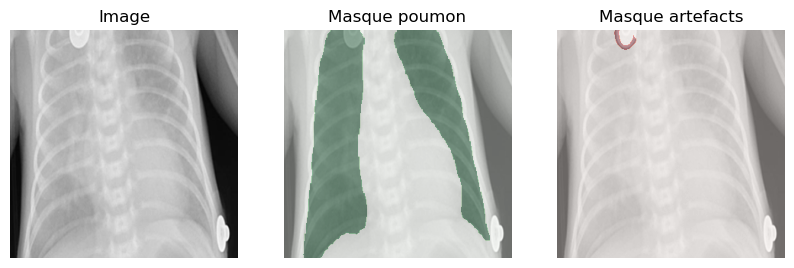

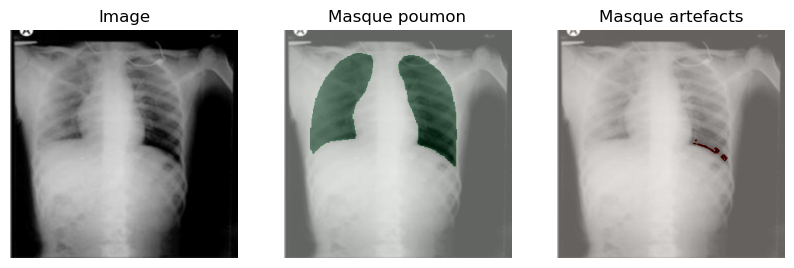

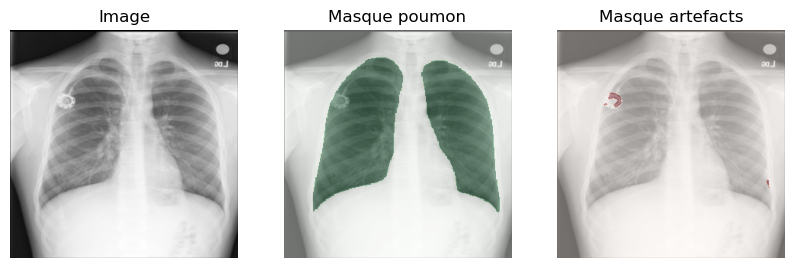

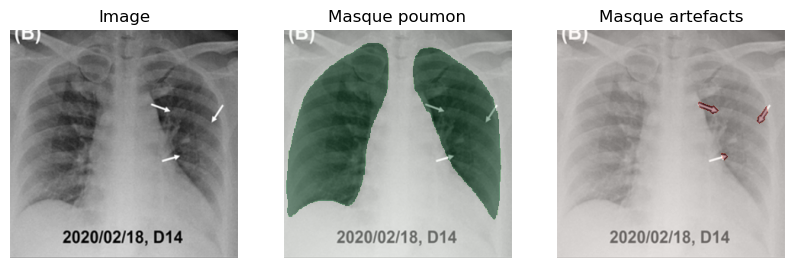

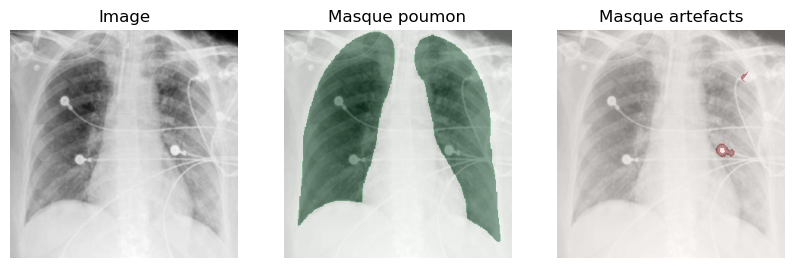

In [ ]:
for _, row in df_test.iterrows():

    img_path = Path(row["image_path"])
    cls = row["class"]
    mask_path = dataset_root / cls / "masks" / img_path.name

    img = cv2.imread(str(img_path), cv2.IMREAD_GRAYSCALE)
    mask = cv2.imread(str(mask_path), cv2.IMREAD_GRAYSCALE)

    if mask.shape != img.shape:
        mask = cv2.resize(mask, (img.shape[1], img.shape[0]), interpolation=cv2.INTER_NEAREST)

    res = detect_artefacts_pure(
        img=img,
        resized_mask=mask,
        debug_mode=False,
        area_ratio_threshold=0.005
    )
    # res = detect_artifacts_hybrid(
    #         img_path=img_path,
    #         dataset_root=dataset_root,
    #         threshold_fft=0.3,        # à ajuster si besoin
    #         sensitivity="medium",
    #         use_mask=True,
    #         area_ratio_threshold=0.005  # à ajuster si besoin
    #     )

    print(f"\n{img_path.name}, classe = {cls}")
    print(f"has_artifacts: {res['has_artifacts']}")

    artifact_mask = res["artifact_mask"]
    

    plt.figure(figsize=(10, 4))
    plt.subplot(1, 3, 1)
    plt.title("Image")
    plt.imshow(img, cmap="gray")
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.title("Masque poumon")
    plt.imshow(img, cmap="gray")
    plt.imshow(mask > 0, cmap="Greens", alpha=0.4)
    plt.axis("off")

    plt.subplot(1, 3, 3)
    plt.title("Masque artefacts")
    plt.imshow(img, cmap="gray")
    plt.imshow(artifact_mask, cmap="Reds", alpha=0.4)
    plt.axis("off")



Image: Viral Pneumonia-409.png | classe=Viral Pneumonia | global=True | fft_conf=0.300 | area_ratio=0.0087


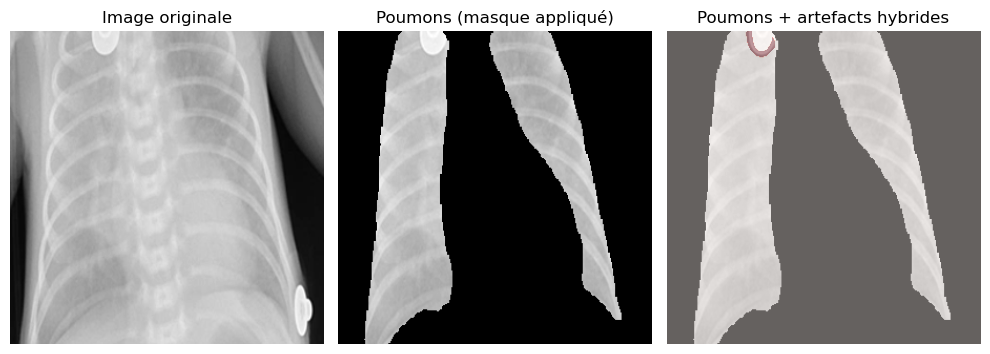


Image: COVID-1568.png | classe=COVID | global=True | fft_conf=0.050 | area_ratio=0.0121


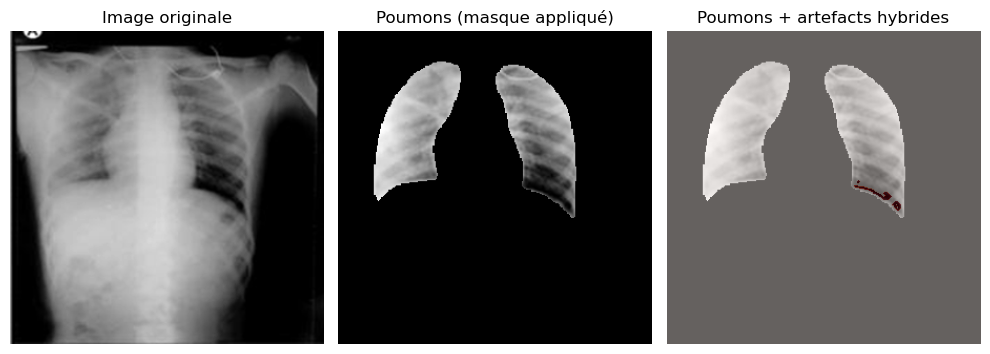


Image: Normal-6602.png | classe=Normal | global=True | fft_conf=0.050 | area_ratio=0.0071


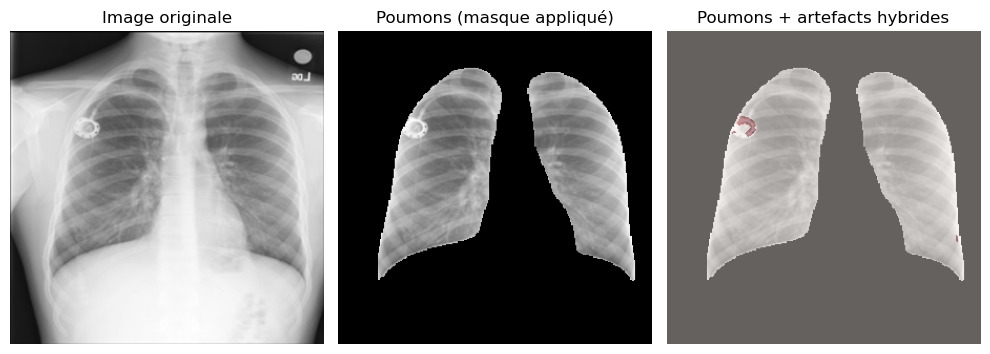


Image: COVID-1079.png | classe=COVID | global=True | fft_conf=0.350 | area_ratio=0.0117


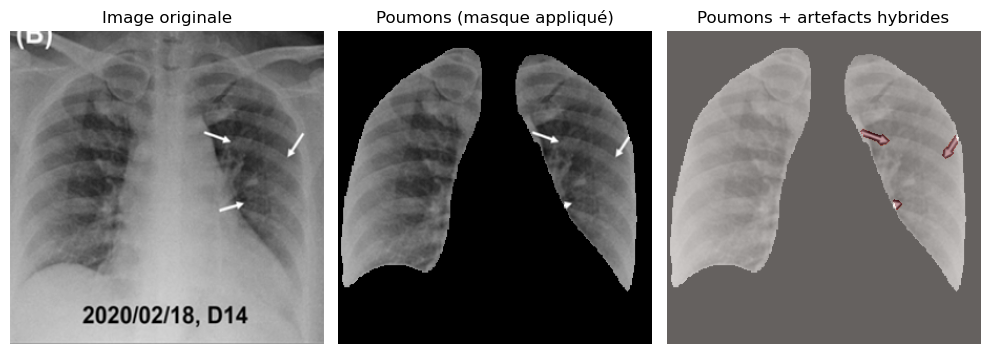


Image: COVID-589.png | classe=COVID | global=True | fft_conf=0.300 | area_ratio=0.0081


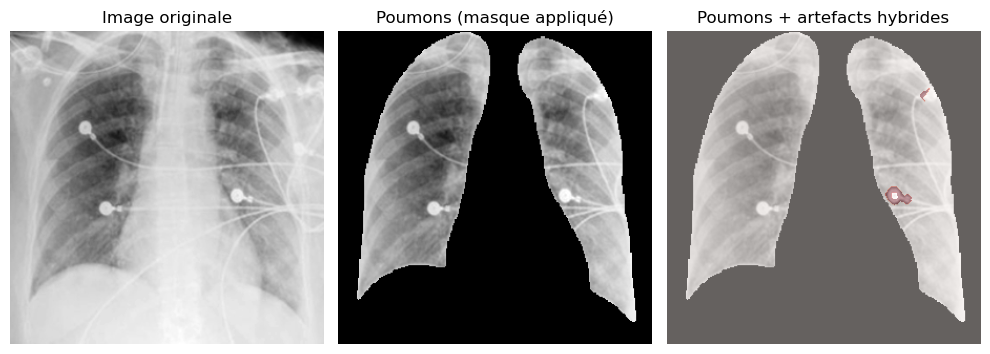


Image: Viral Pneumonia-375.png | classe=Viral Pneumonia | global=True | fft_conf=0.050 | area_ratio=0.0054


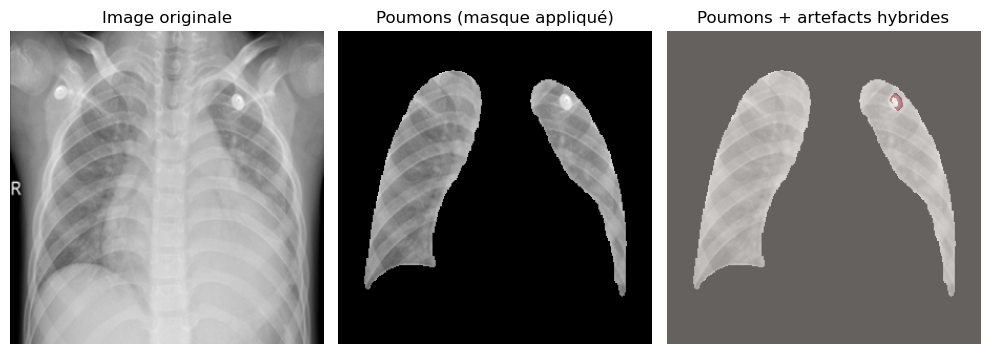


Image: Viral Pneumonia-992.png | classe=Viral Pneumonia | global=True | fft_conf=0.050 | area_ratio=0.0052


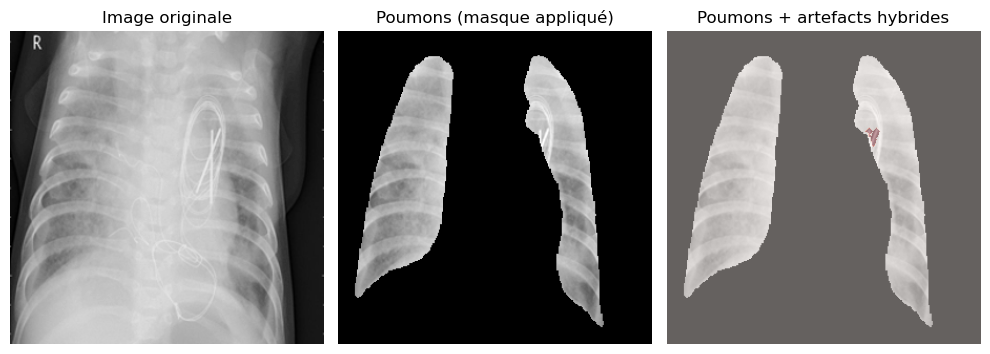


Image: COVID-1273.png | classe=COVID | global=True | fft_conf=0.300 | area_ratio=0.0085


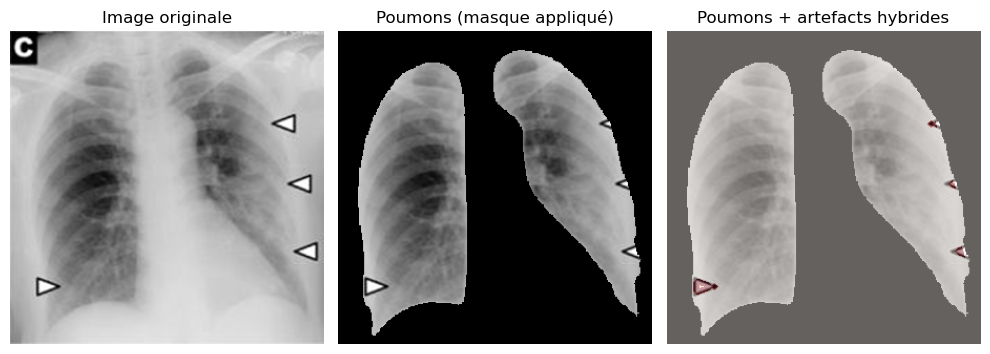


Image: COVID-2188.png | classe=COVID | global=True | fft_conf=0.050 | area_ratio=0.0115


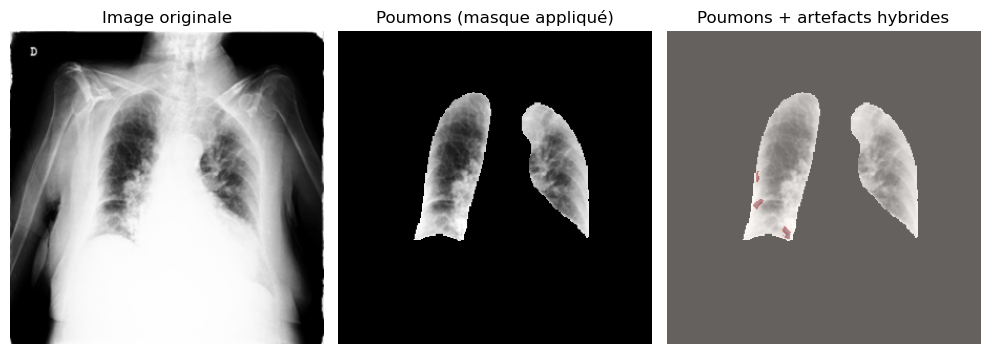


Image: Normal-8122.png | classe=Normal | global=True | fft_conf=0.050 | area_ratio=0.0057


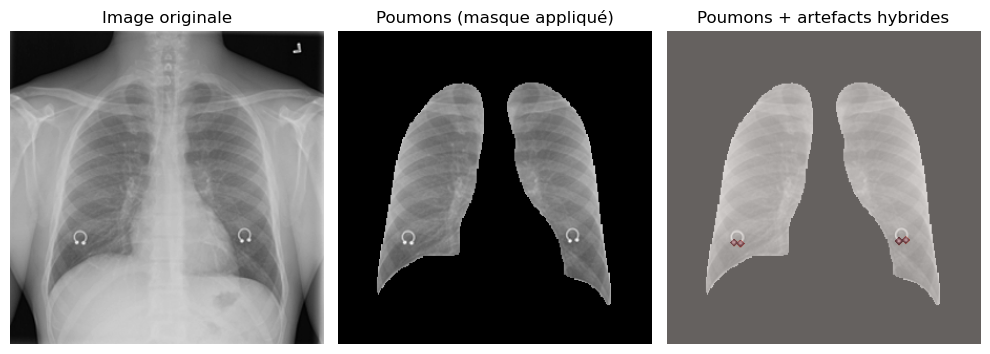


Image: Normal-4728.png | classe=Normal | global=True | fft_conf=0.300 | area_ratio=0.0068


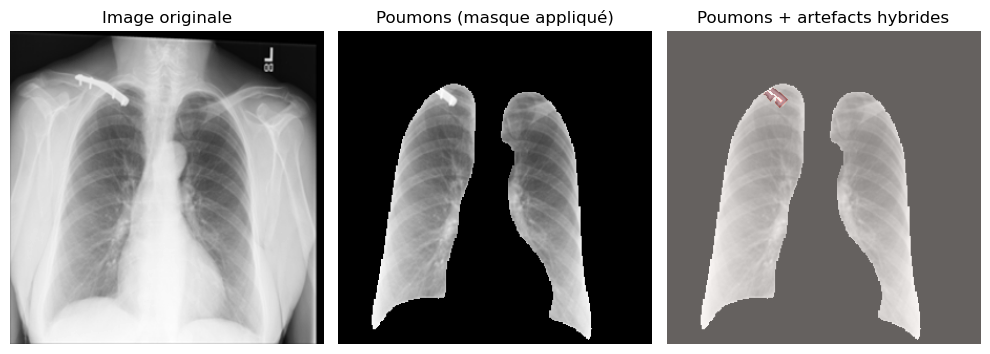


Image: COVID-516.png | classe=COVID | global=True | fft_conf=0.050 | area_ratio=0.0107


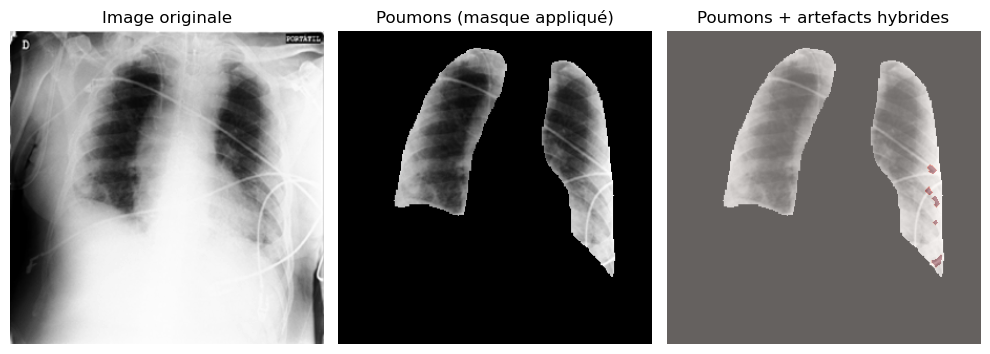


Image: Lung_Opacity-3899.png | classe=Lung_Opacity | global=True | fft_conf=0.250 | area_ratio=0.0326


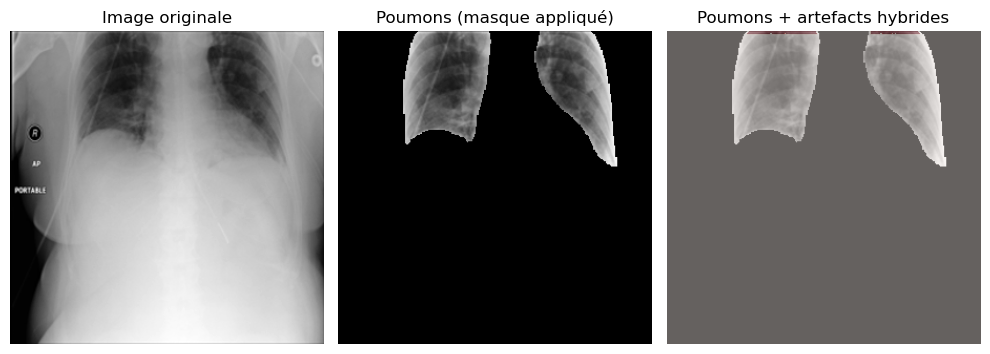


Image: Normal-1229.png | classe=Normal | global=True | fft_conf=0.050 | area_ratio=0.0054


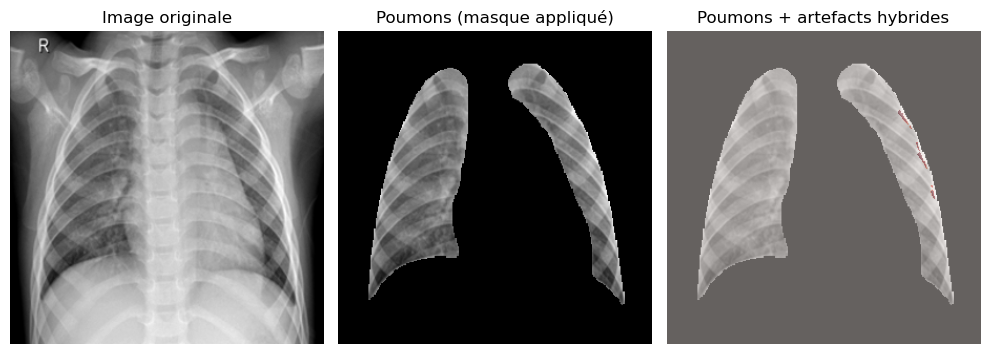


Image: Normal-6758.png | classe=Normal | global=True | fft_conf=0.250 | area_ratio=0.0128


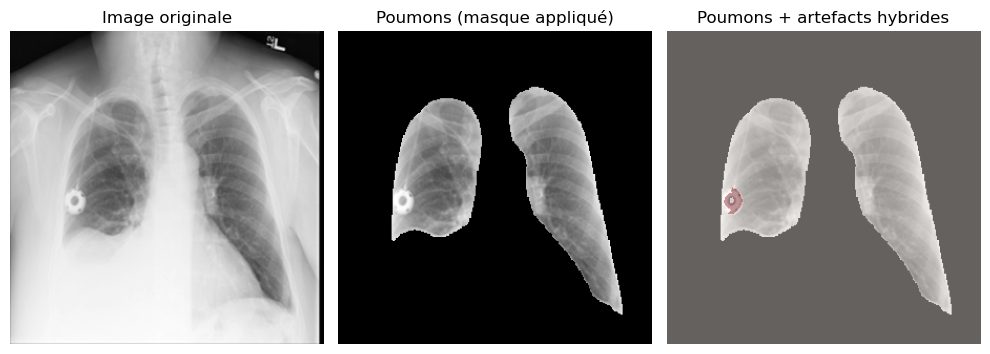


Image: Lung_Opacity-5983.png | classe=Lung_Opacity | global=True | fft_conf=0.050 | area_ratio=0.0168


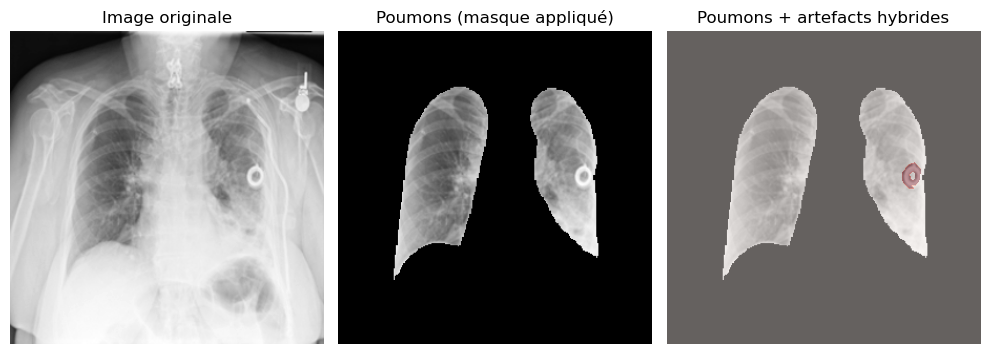


Image: COVID-1889.png | classe=COVID | global=True | fft_conf=0.250 | area_ratio=0.0087


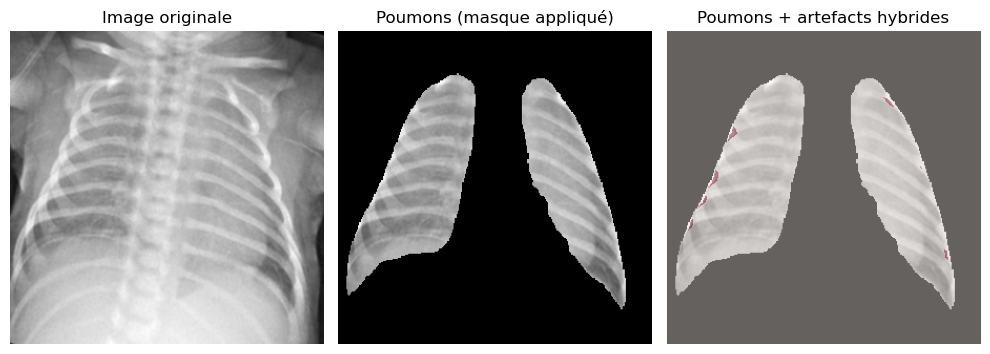


Image: Normal-5581.png | classe=Normal | global=True | fft_conf=0.250 | area_ratio=0.0135


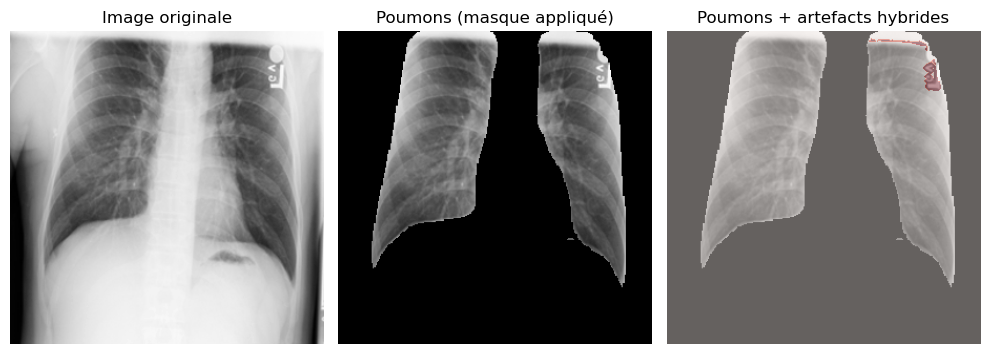


Image: Normal-8084.png | classe=Normal | global=True | fft_conf=0.050 | area_ratio=0.0095


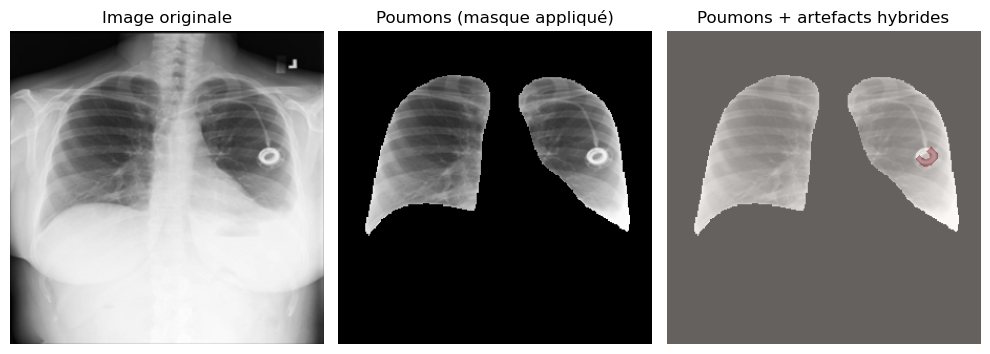


Image: Lung_Opacity-612.png | classe=Lung_Opacity | global=True | fft_conf=0.050 | area_ratio=0.0136


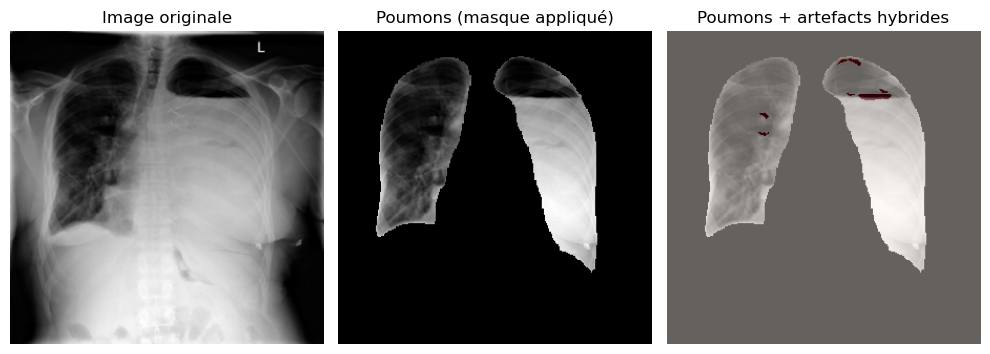


Image: Viral Pneumonia-564.png | classe=Viral Pneumonia | global=True | fft_conf=0.050 | area_ratio=0.0069


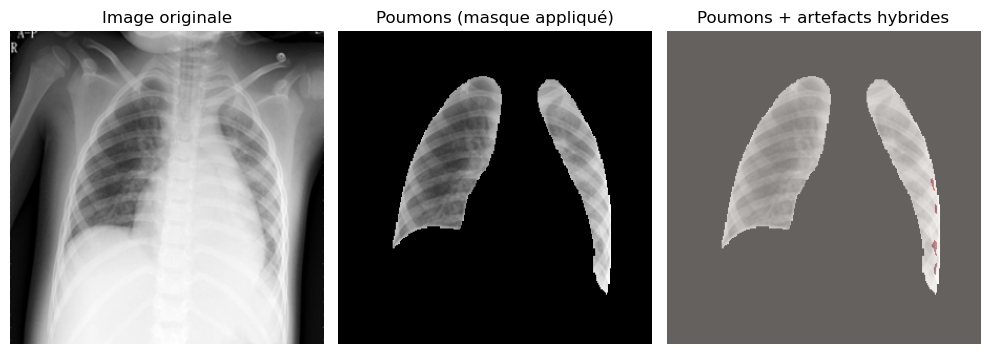


Image: COVID-1405.png | classe=COVID | global=True | fft_conf=0.300 | area_ratio=0.0053


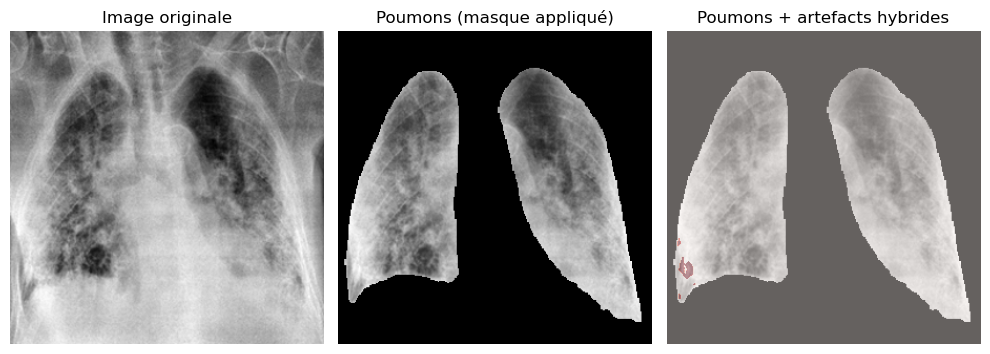


Image: COVID-90.png | classe=COVID | global=True | fft_conf=0.250 | area_ratio=0.0071


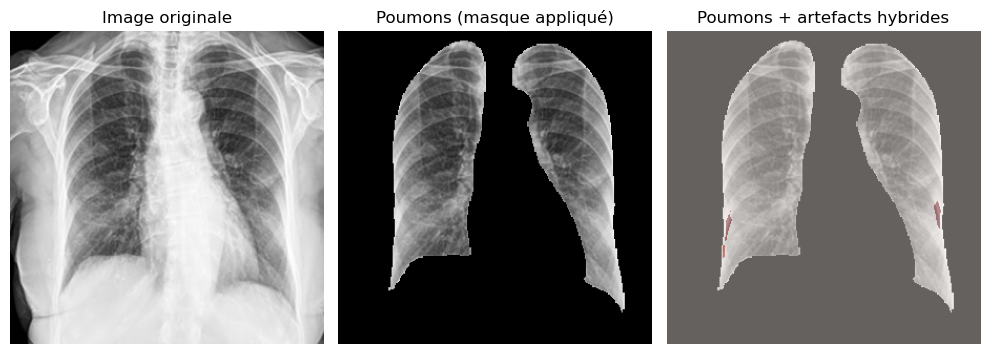


Image: Viral Pneumonia-1081.png | classe=Viral Pneumonia | global=True | fft_conf=0.050 | area_ratio=0.0098


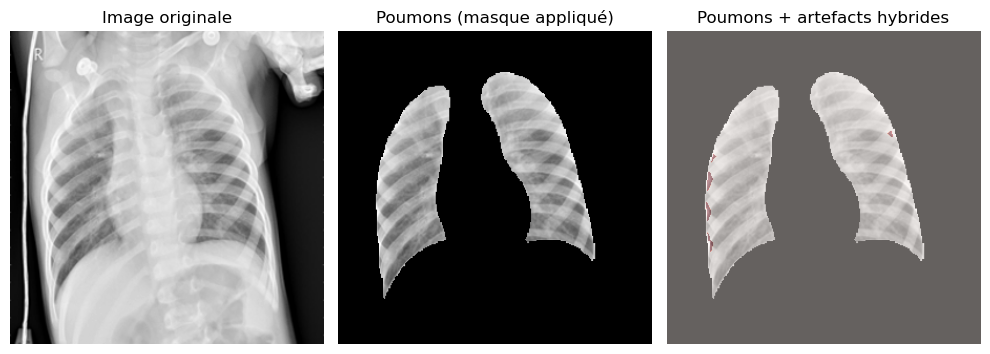


Image: Lung_Opacity-185.png | classe=Lung_Opacity | global=True | fft_conf=0.050 | area_ratio=0.0153


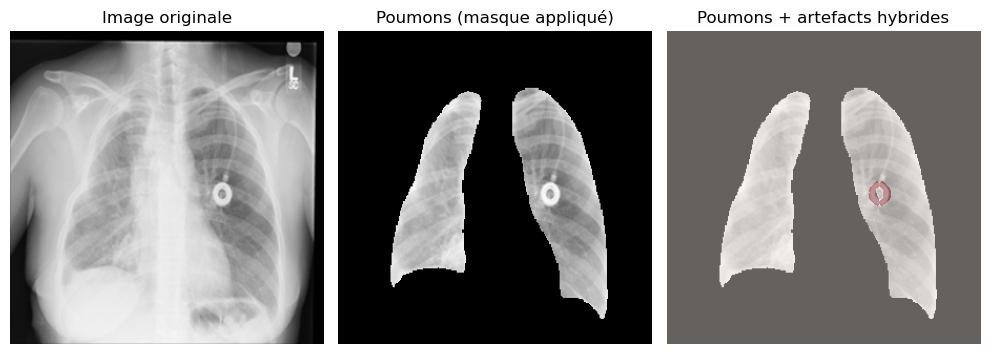


Image: COVID-1108.png | classe=COVID | global=True | fft_conf=0.250 | area_ratio=0.0089


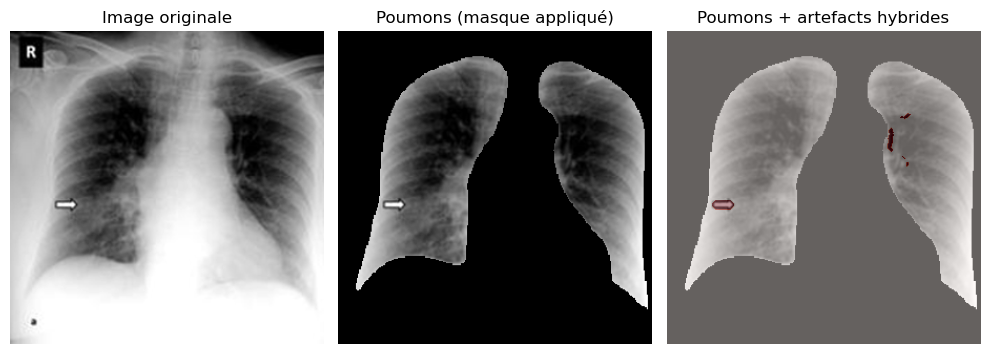


Image: Normal-3705.png | classe=Normal | global=True | fft_conf=0.050 | area_ratio=0.0120


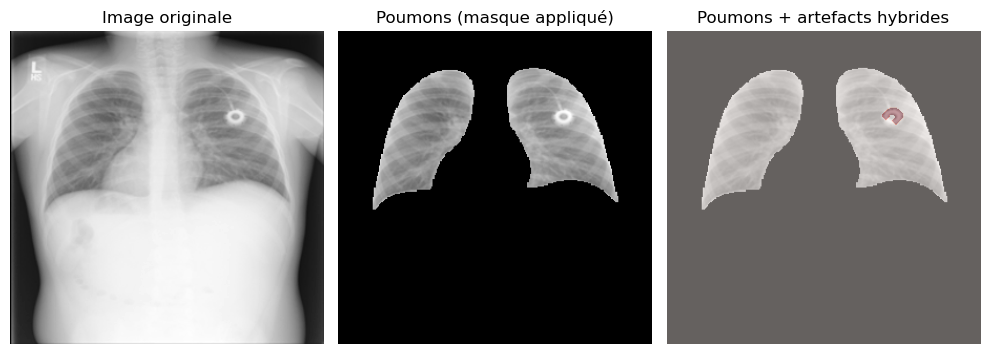


Image: Lung_Opacity-5159.png | classe=Lung_Opacity | global=True | fft_conf=0.250 | area_ratio=0.0167


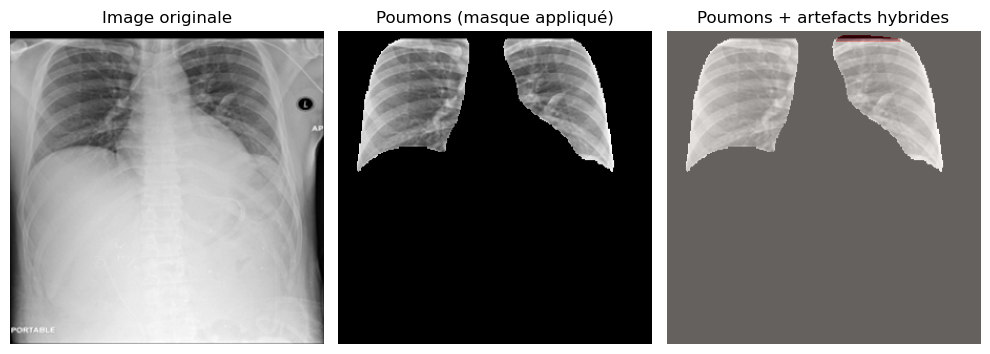


Image: Lung_Opacity-1395.png | classe=Lung_Opacity | global=True | fft_conf=0.100 | area_ratio=0.0067


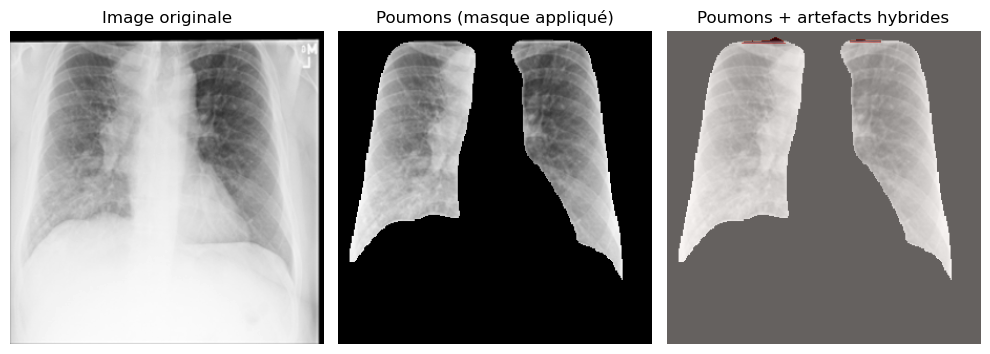


Image: COVID-1179.png | classe=COVID | global=True | fft_conf=0.400 | area_ratio=0.0249


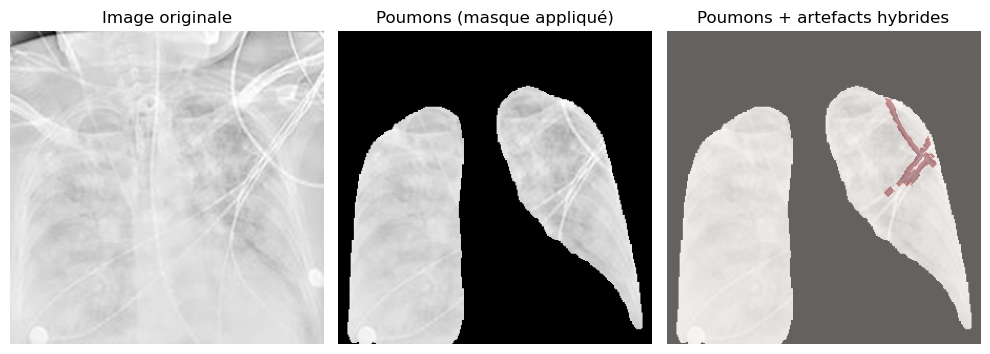


Image: Normal-7255.png | classe=Normal | global=True | fft_conf=0.050 | area_ratio=0.0094


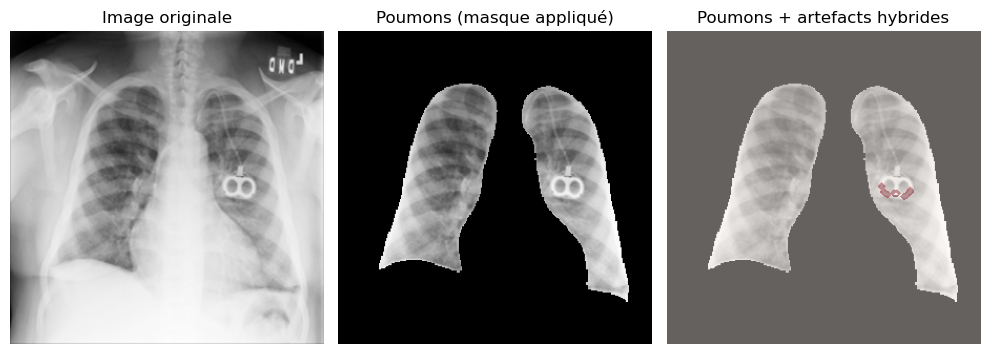


Image: Viral Pneumonia-1316.png | classe=Viral Pneumonia | global=True | fft_conf=0.050 | area_ratio=0.0130


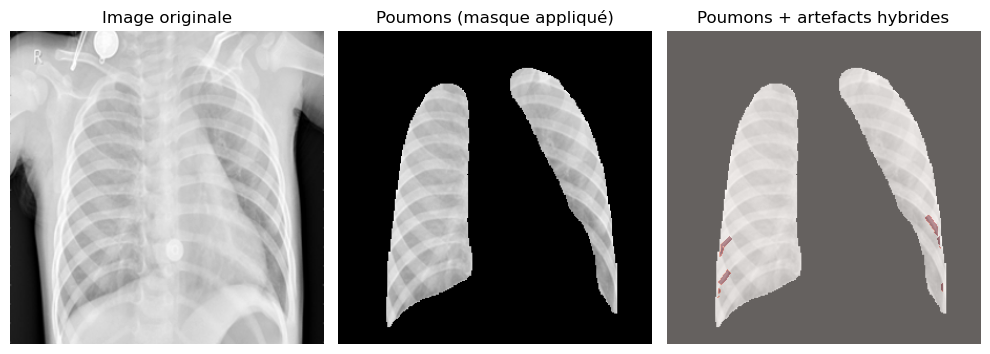


Image: Normal-7521.png | classe=Normal | global=True | fft_conf=0.050 | area_ratio=0.0133


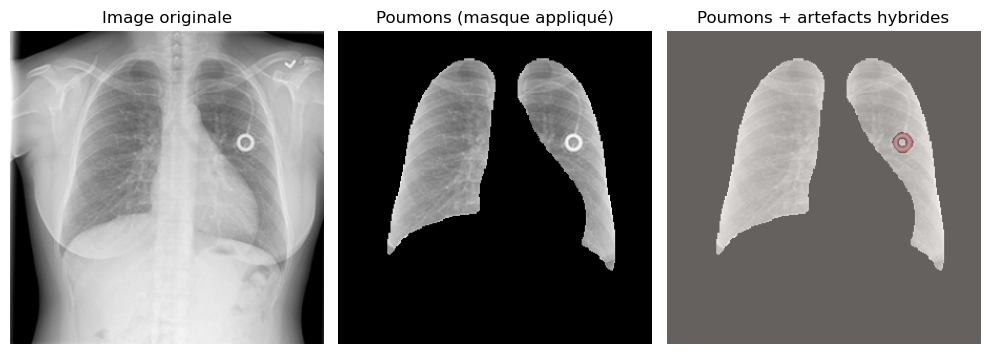


Image: Viral Pneumonia-1238.png | classe=Viral Pneumonia | global=True | fft_conf=0.250 | area_ratio=0.0064


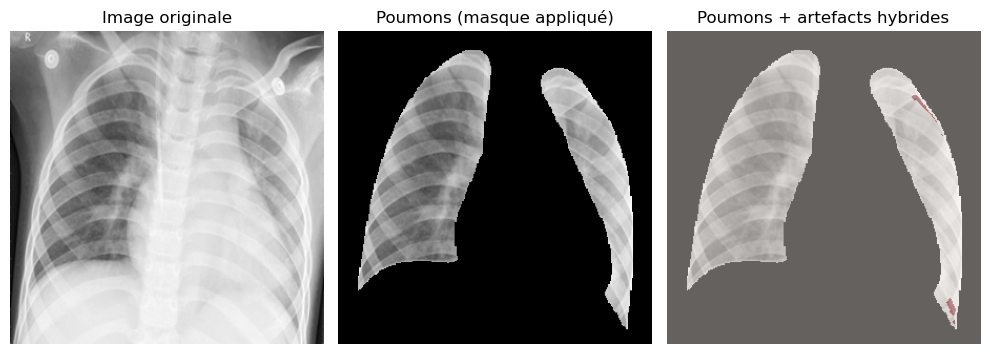


Image: Normal-7829.png | classe=Normal | global=True | fft_conf=0.050 | area_ratio=0.0078


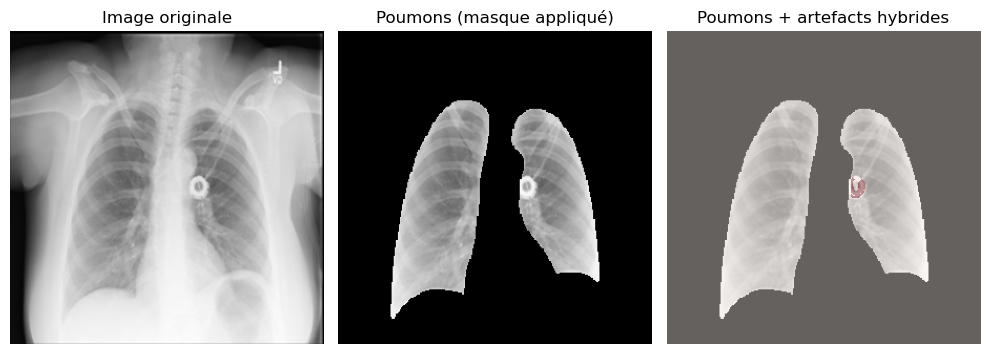


Image: Normal-1053.png | classe=Normal | global=True | fft_conf=0.250 | area_ratio=0.0071


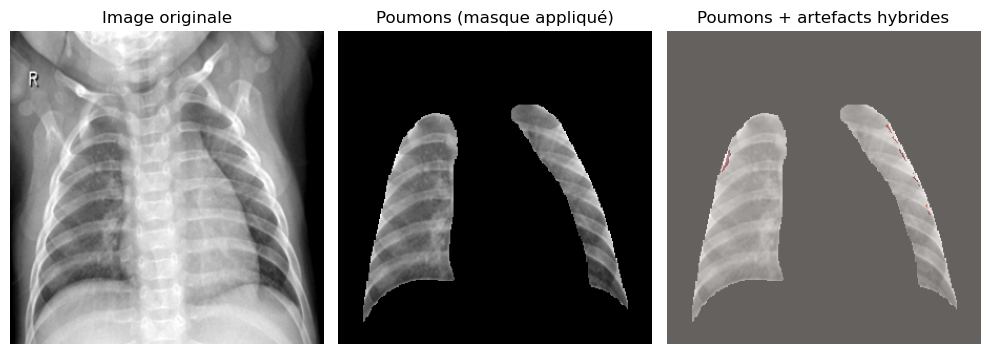


Image: COVID-952.png | classe=COVID | global=True | fft_conf=0.250 | area_ratio=0.0066


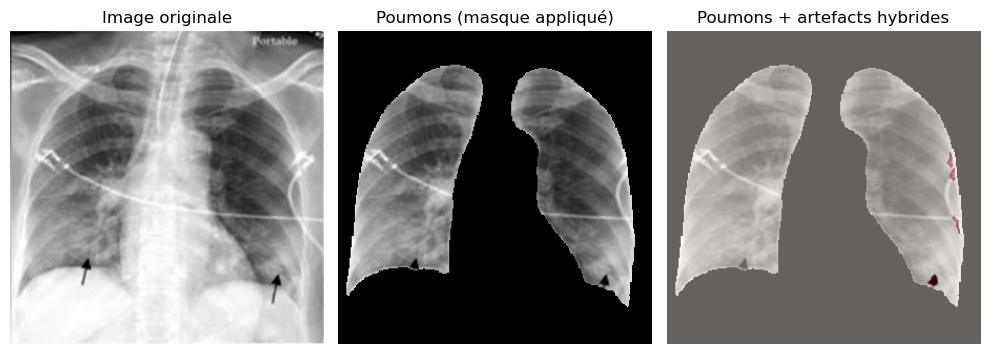


Image: COVID-2361.png | classe=COVID | global=True | fft_conf=0.050 | area_ratio=0.0142


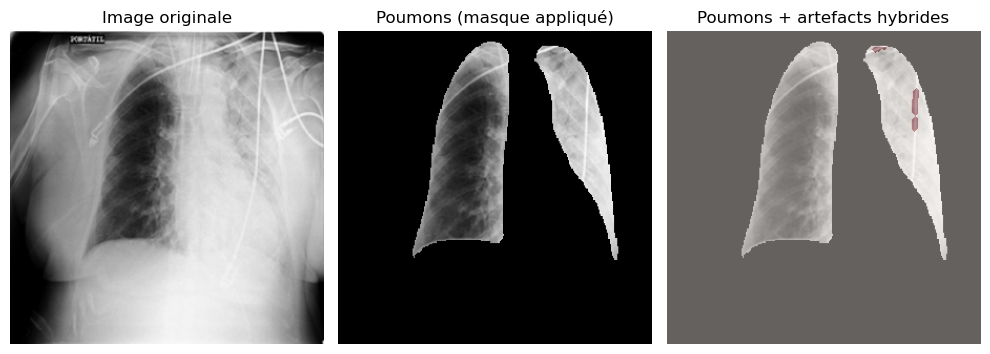


Image: Normal-1444.png | classe=Normal | global=True | fft_conf=0.050 | area_ratio=0.0194


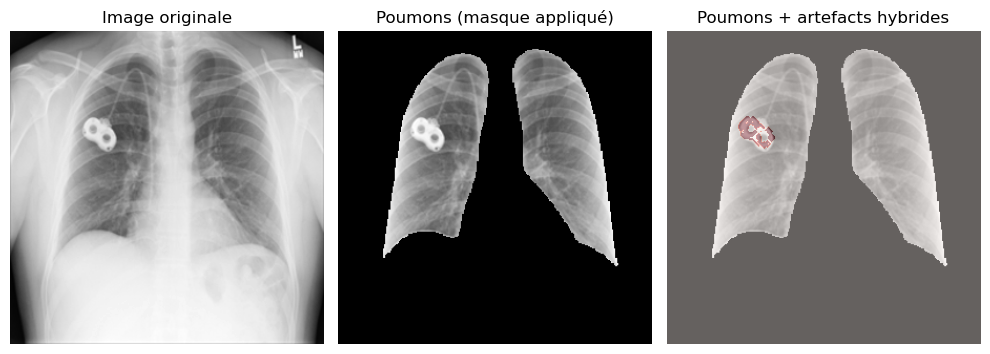


Image: Lung_Opacity-5956.png | classe=Lung_Opacity | global=True | fft_conf=0.050 | area_ratio=0.0055


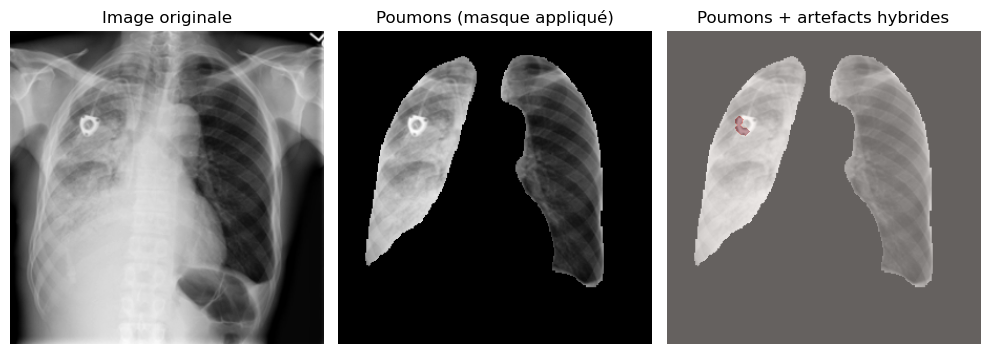


Image: Normal-2107.png | classe=Normal | global=True | fft_conf=0.250 | area_ratio=0.0054


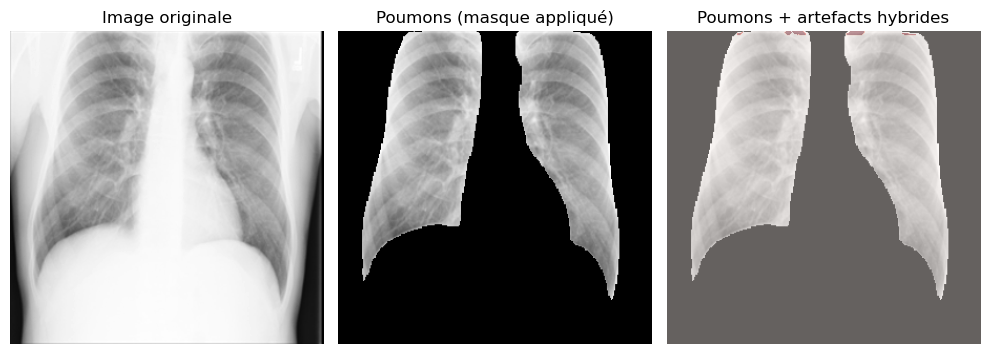


Image: Normal-5168.png | classe=Normal | global=True | fft_conf=0.050 | area_ratio=0.0114


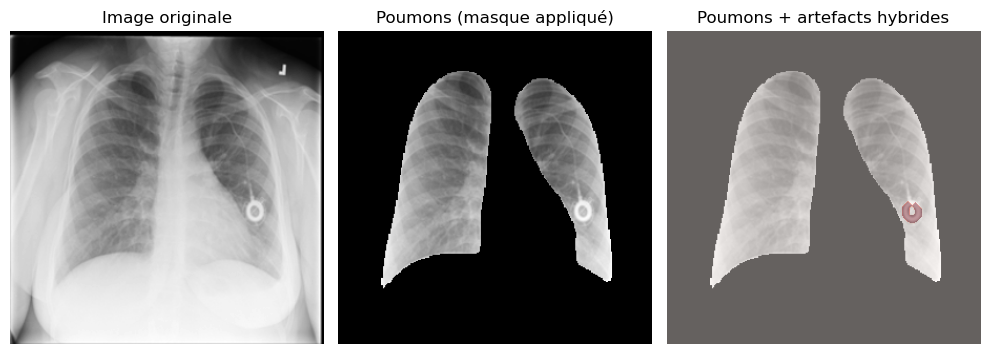


Image: Lung_Opacity-305.png | classe=Lung_Opacity | global=True | fft_conf=0.050 | area_ratio=0.0139


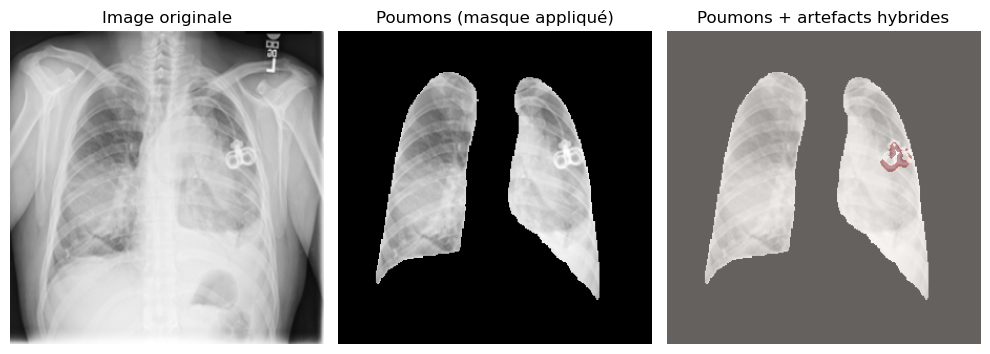


Image: COVID-1046.png | classe=COVID | global=True | fft_conf=0.350 | area_ratio=0.0055


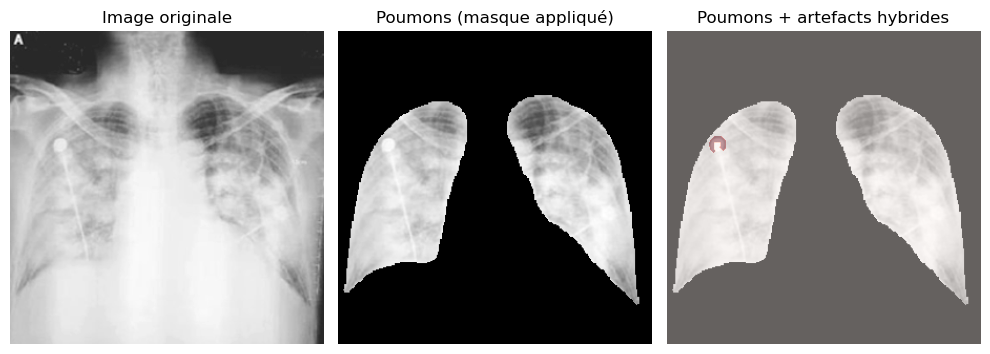


Image: Normal-7376.png | classe=Normal | global=True | fft_conf=0.050 | area_ratio=0.0152


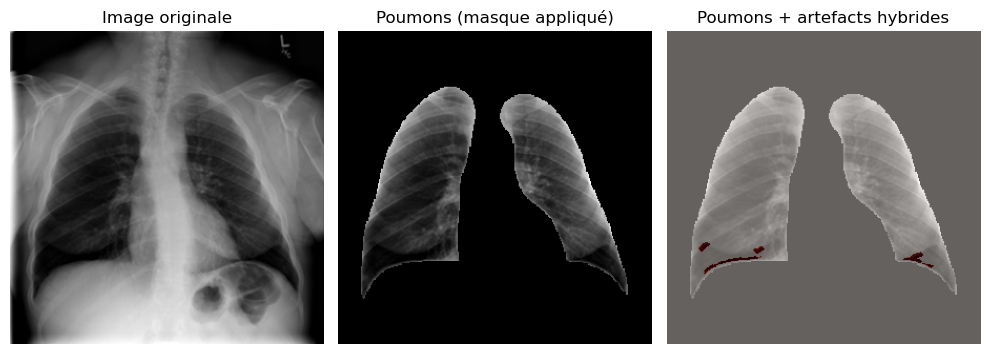


Image: Lung_Opacity-295.png | classe=Lung_Opacity | global=True | fft_conf=0.050 | area_ratio=0.0172


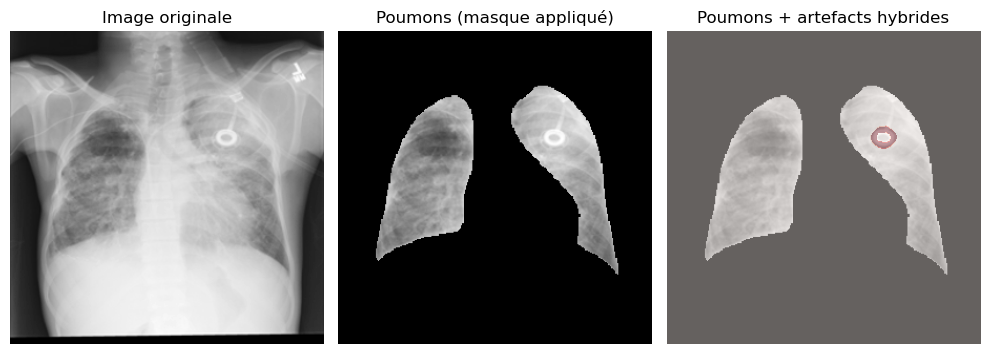


Image: Lung_Opacity-2802.png | classe=Lung_Opacity | global=True | fft_conf=0.100 | area_ratio=0.0054


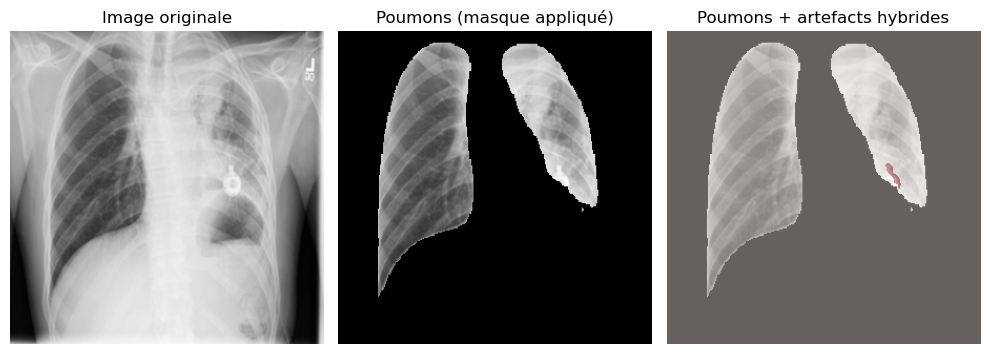


Image: COVID-1163.png | classe=COVID | global=True | fft_conf=0.250 | area_ratio=0.0134


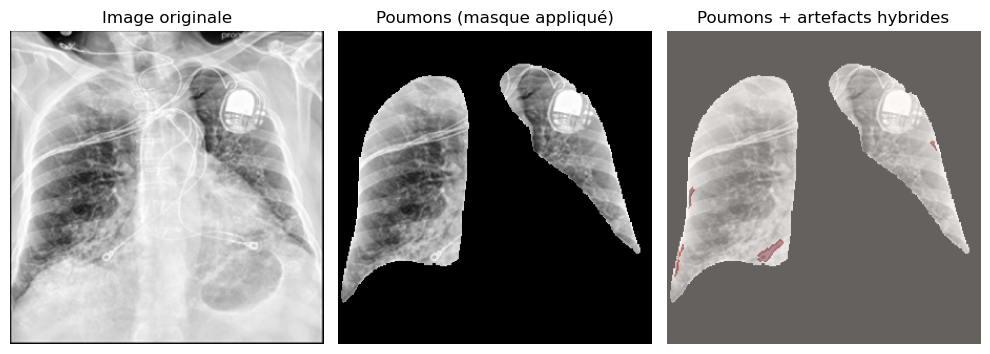


Image: COVID-2187.png | classe=COVID | global=True | fft_conf=0.050 | area_ratio=0.0059


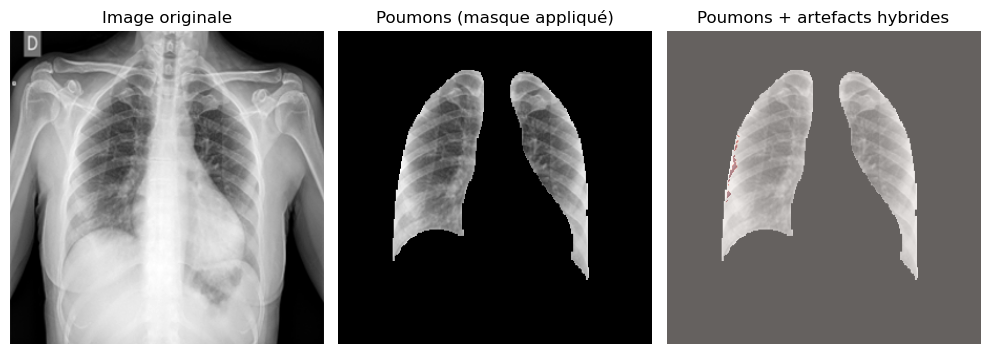


Image: COVID-2360.png | classe=COVID | global=True | fft_conf=0.050 | area_ratio=0.0185


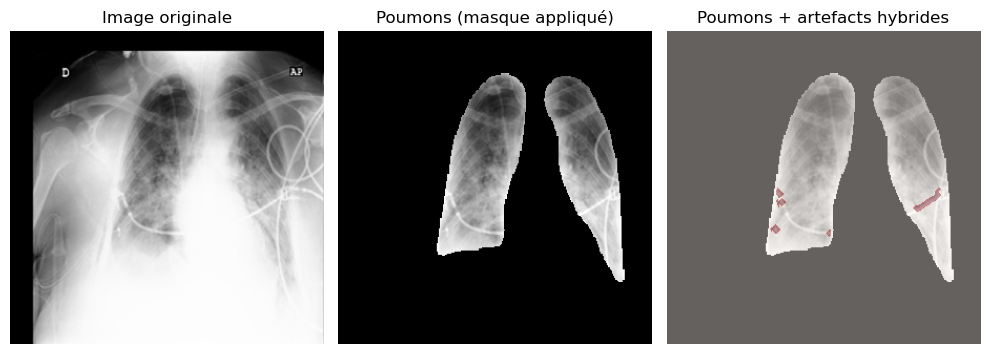


Image: Lung_Opacity-2677.png | classe=Lung_Opacity | global=True | fft_conf=0.050 | area_ratio=0.0873


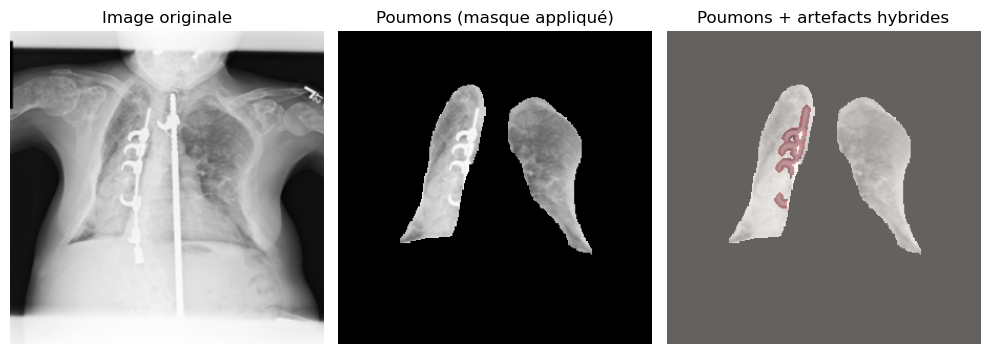


Image: Lung_Opacity-24.png | classe=Lung_Opacity | global=True | fft_conf=0.050 | area_ratio=0.0133


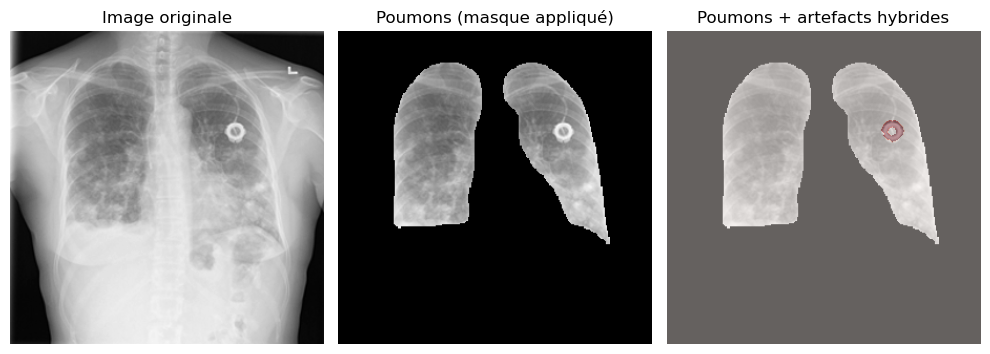


Image: COVID-1171.png | classe=COVID | global=True | fft_conf=0.050 | area_ratio=0.0094


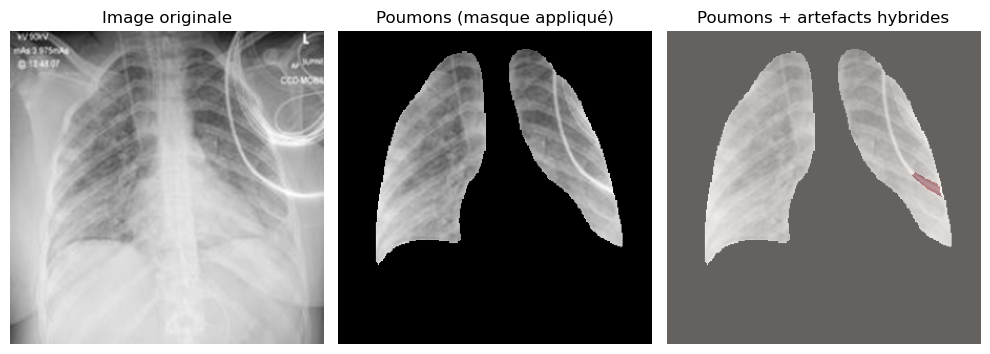


Image: Lung_Opacity-60.png | classe=Lung_Opacity | global=True | fft_conf=0.050 | area_ratio=0.0152


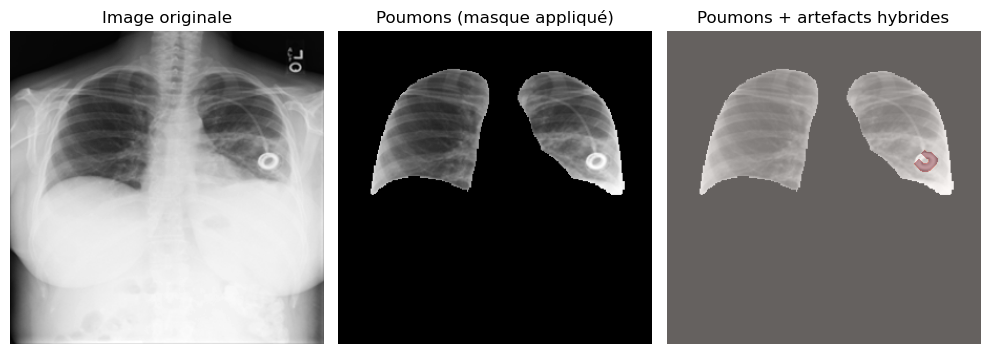


Image: Viral Pneumonia-362.png | classe=Viral Pneumonia | global=True | fft_conf=0.300 | area_ratio=0.0063


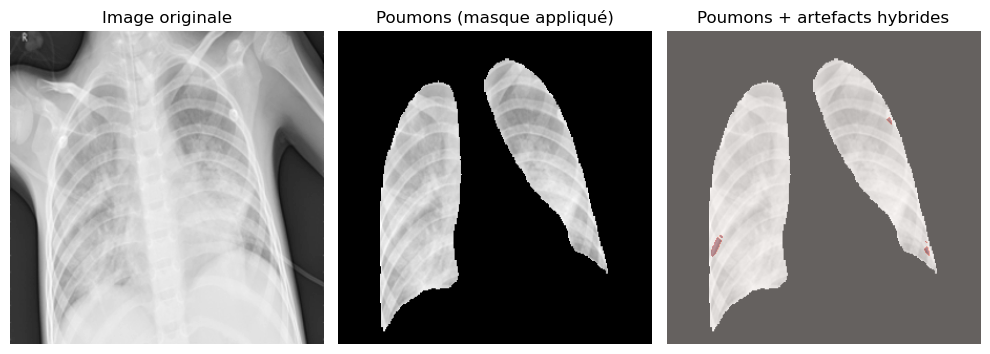


Image: Lung_Opacity-779.png | classe=Lung_Opacity | global=True | fft_conf=0.300 | area_ratio=0.0064


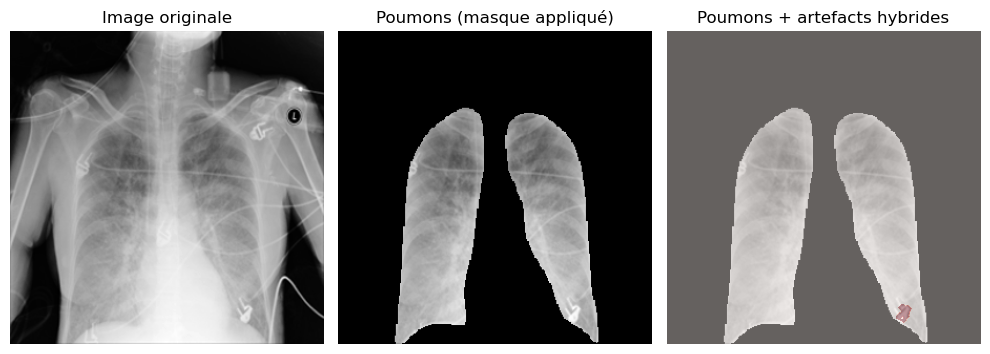


Image: COVID-1013.png | classe=COVID | global=True | fft_conf=0.100 | area_ratio=0.0059


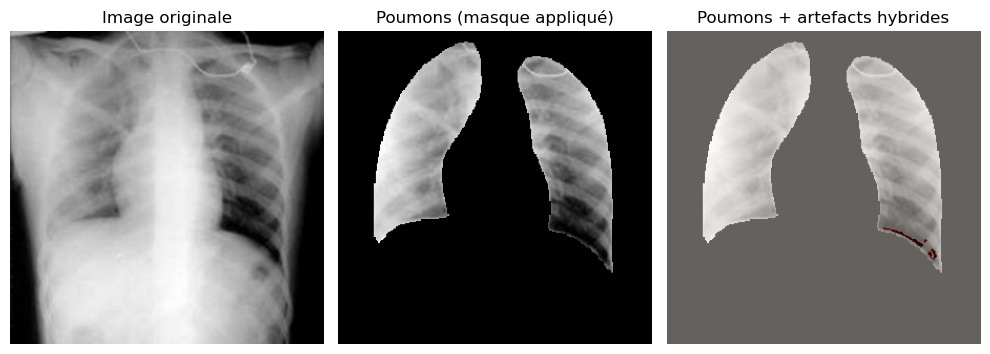


Image: Lung_Opacity-191.png | classe=Lung_Opacity | global=True | fft_conf=0.050 | area_ratio=0.0125


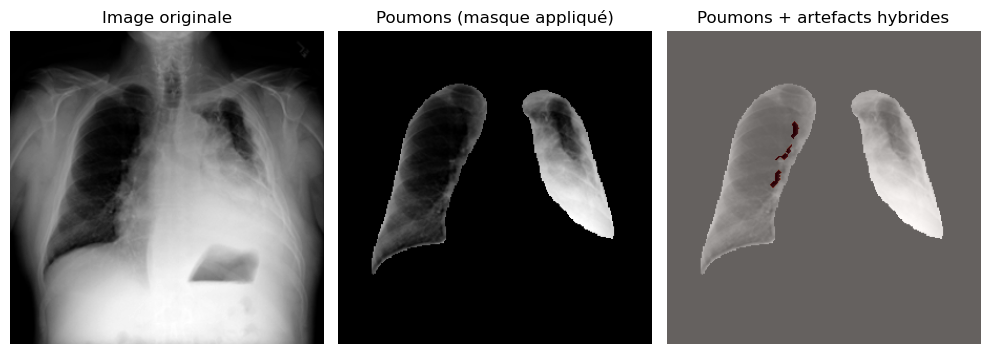


Image: COVID-999.png | classe=COVID | global=True | fft_conf=0.250 | area_ratio=0.0073


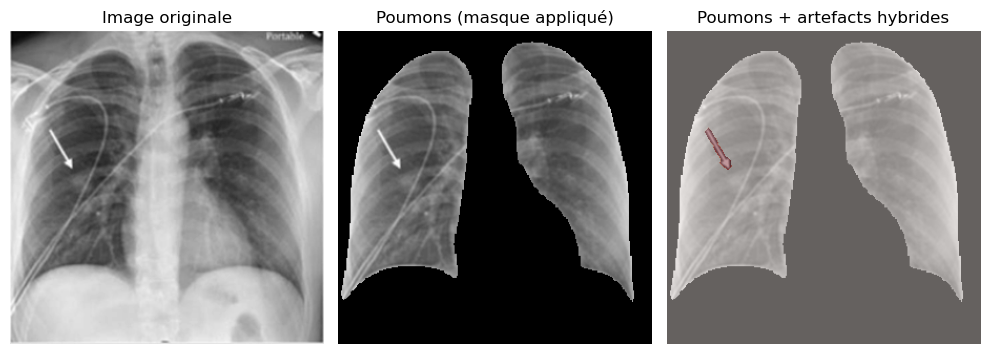


Image: Lung_Opacity-637.png | classe=Lung_Opacity | global=True | fft_conf=0.051 | area_ratio=0.0746


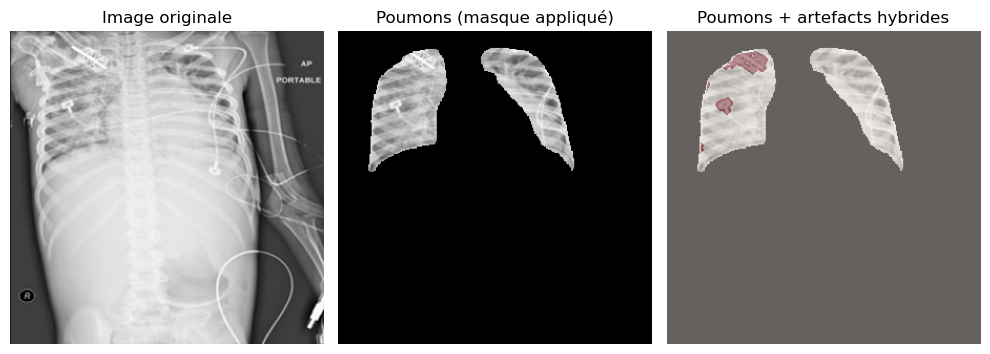


Image: Lung_Opacity-5893.png | classe=Lung_Opacity | global=True | fft_conf=0.050 | area_ratio=0.0145


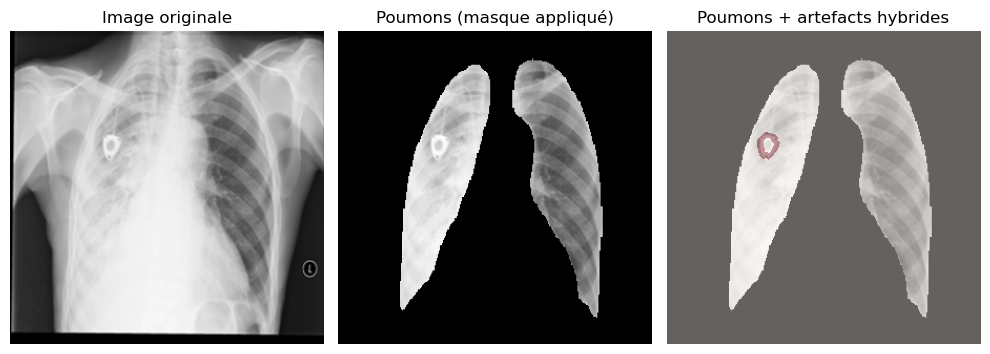


Image: COVID-1829.png | classe=COVID | global=True | fft_conf=0.250 | area_ratio=0.0187


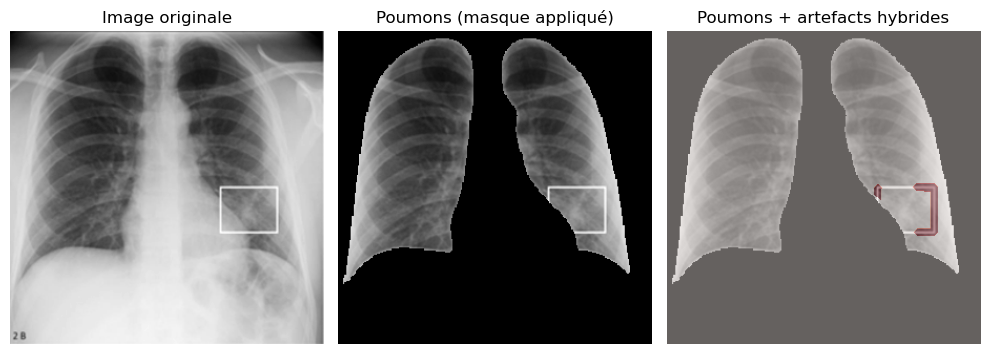


Image: Normal-1962.png | classe=Normal | global=True | fft_conf=0.050 | area_ratio=0.0101


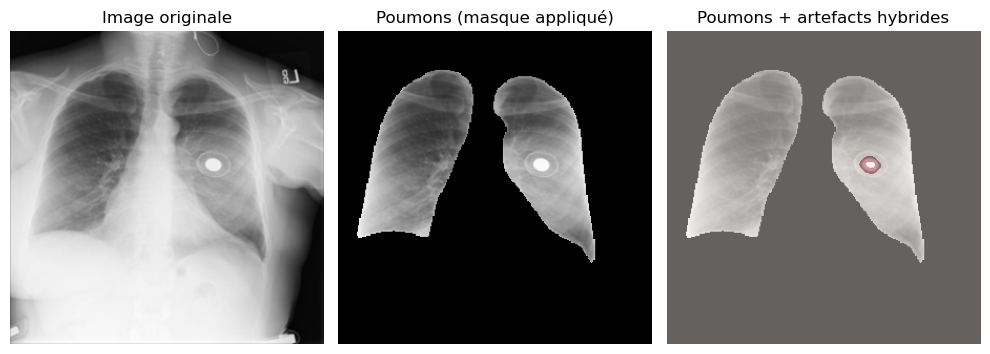


Image: Lung_Opacity-197.png | classe=Lung_Opacity | global=True | fft_conf=0.250 | area_ratio=0.0061


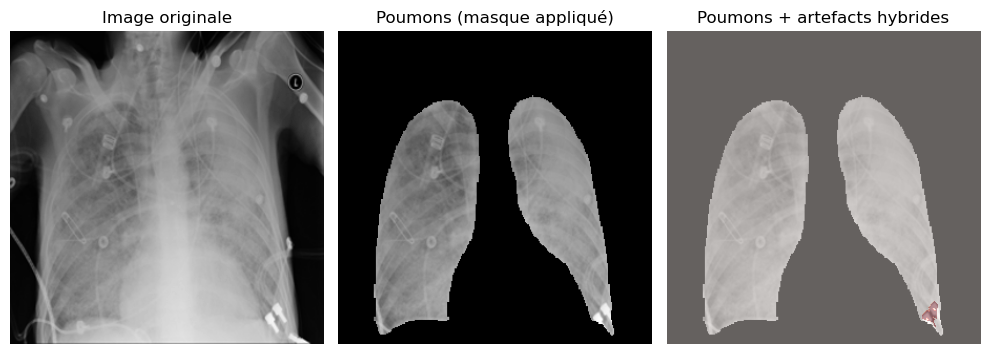


Image: COVID-538.png | classe=COVID | global=True | fft_conf=0.300 | area_ratio=0.0135


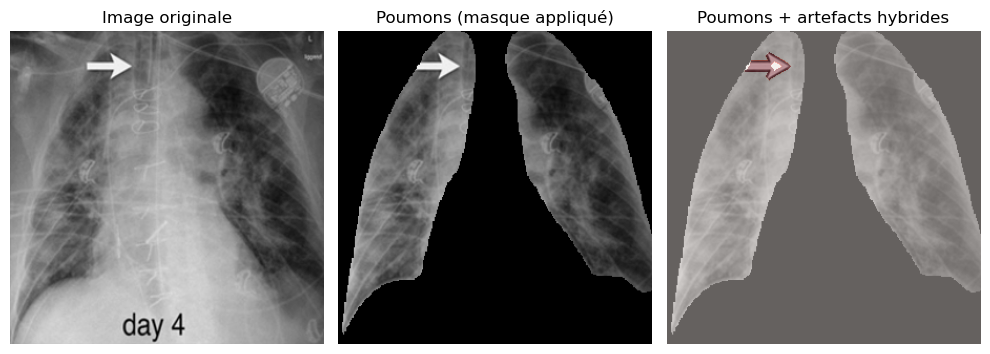


Image: Lung_Opacity-1470.png | classe=Lung_Opacity | global=True | fft_conf=0.250 | area_ratio=0.0062


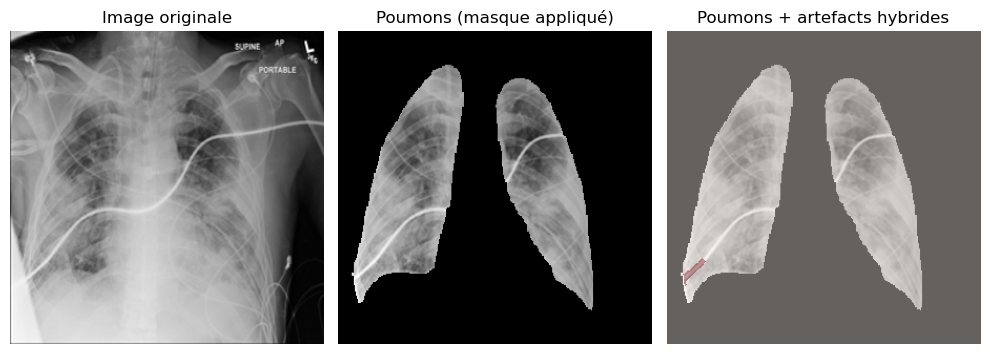


Image: Viral Pneumonia-209.png | classe=Viral Pneumonia | global=True | fft_conf=0.250 | area_ratio=0.0100


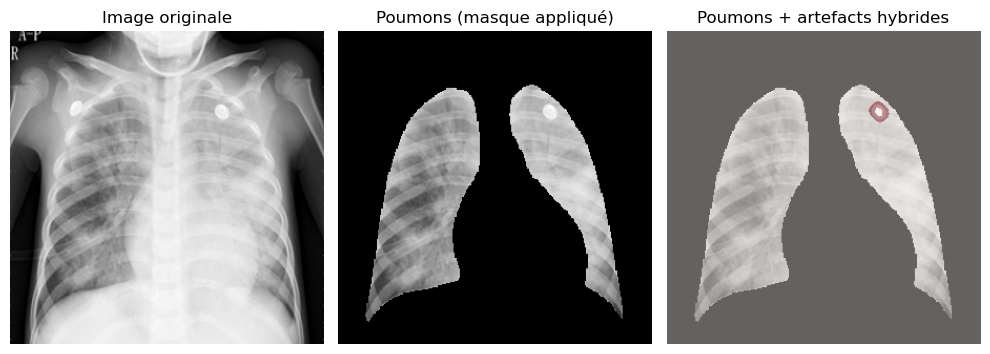


Image: Lung_Opacity-852.png | classe=Lung_Opacity | global=True | fft_conf=0.250 | area_ratio=0.0119


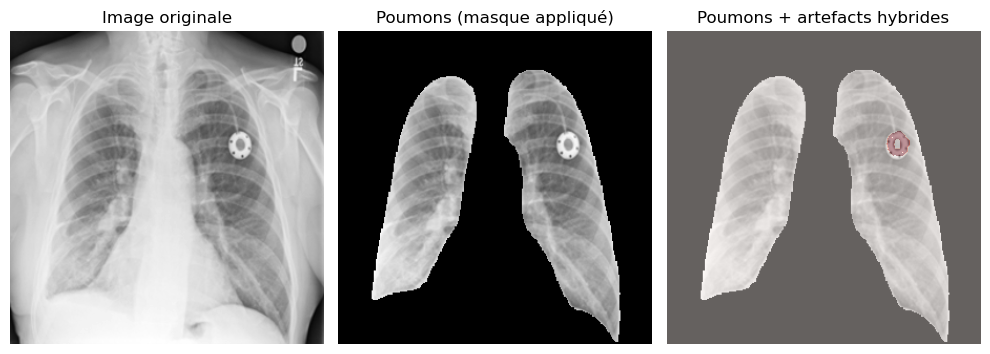


Image: Normal-8397.png | classe=Normal | global=True | fft_conf=0.250 | area_ratio=0.0089


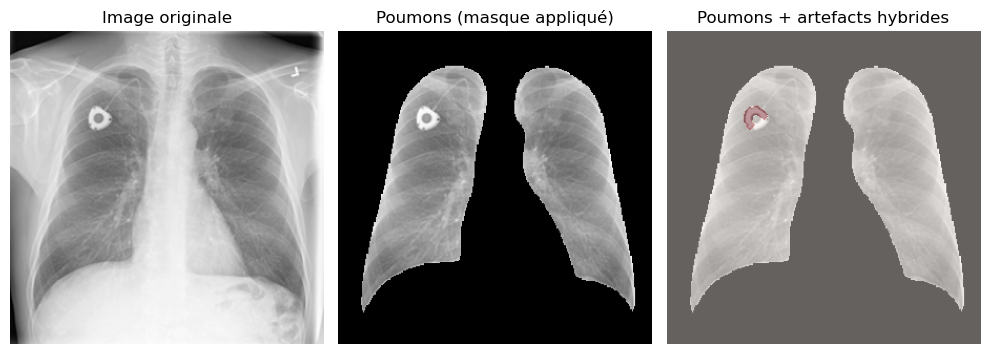


Image: Normal-9933.png | classe=Normal | global=True | fft_conf=0.250 | area_ratio=0.0083


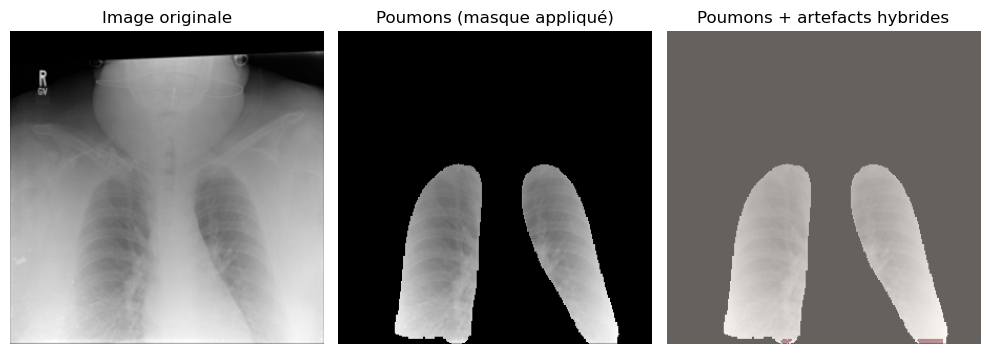


Image: Lung_Opacity-1657.png | classe=Lung_Opacity | global=True | fft_conf=0.050 | area_ratio=0.0141


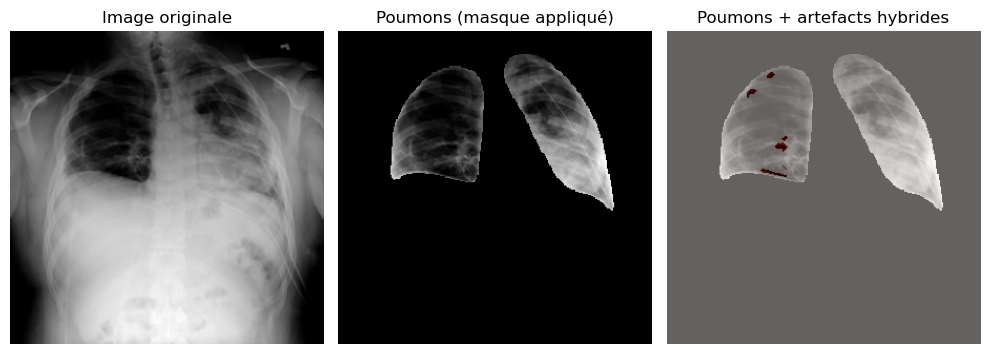


Image: Normal-9702.png | classe=Normal | global=True | fft_conf=0.050 | area_ratio=0.0145


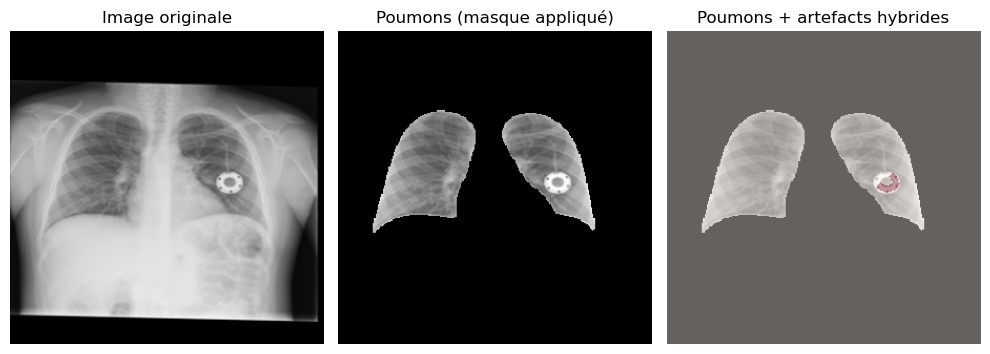


Image: COVID-2030.png | classe=COVID | global=True | fft_conf=0.050 | area_ratio=0.0065


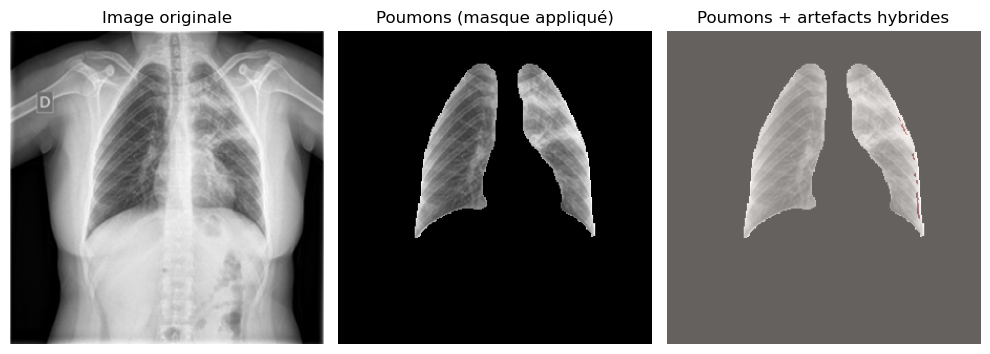


Image: Normal-6041.png | classe=Normal | global=True | fft_conf=0.050 | area_ratio=0.0064


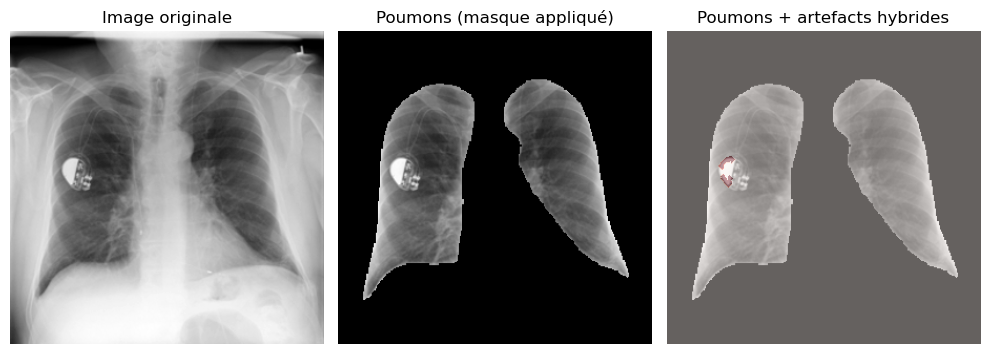


Image: COVID-283.png | classe=COVID | global=True | fft_conf=0.050 | area_ratio=0.0107


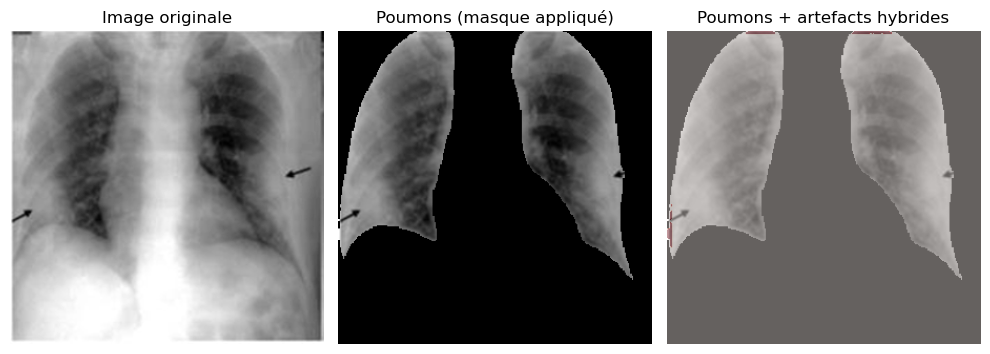


Image: Lung_Opacity-1248.png | classe=Lung_Opacity | global=True | fft_conf=0.050 | area_ratio=0.0079


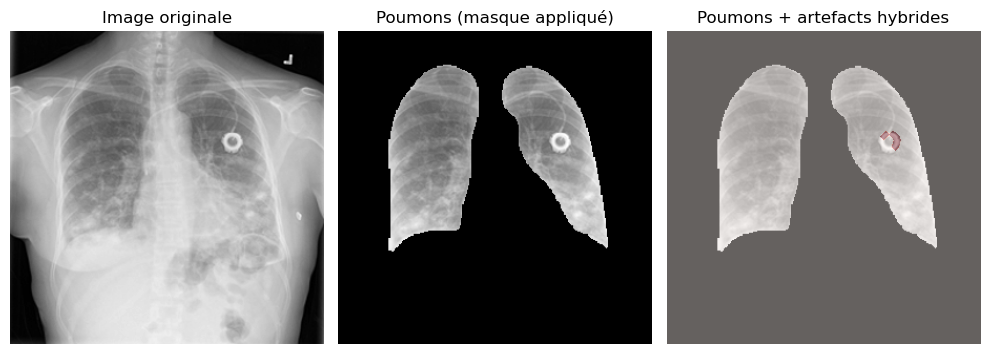


Image: Lung_Opacity-5479.png | classe=Lung_Opacity | global=True | fft_conf=0.300 | area_ratio=0.0053


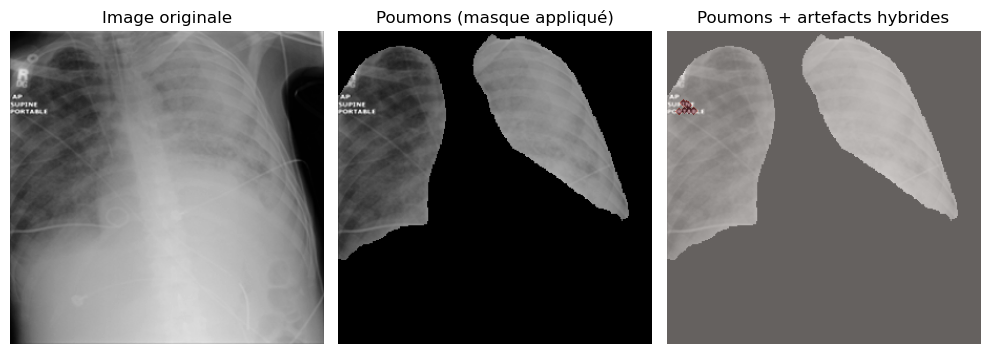


Image: Viral Pneumonia-84.png | classe=Viral Pneumonia | global=True | fft_conf=0.050 | area_ratio=0.0080


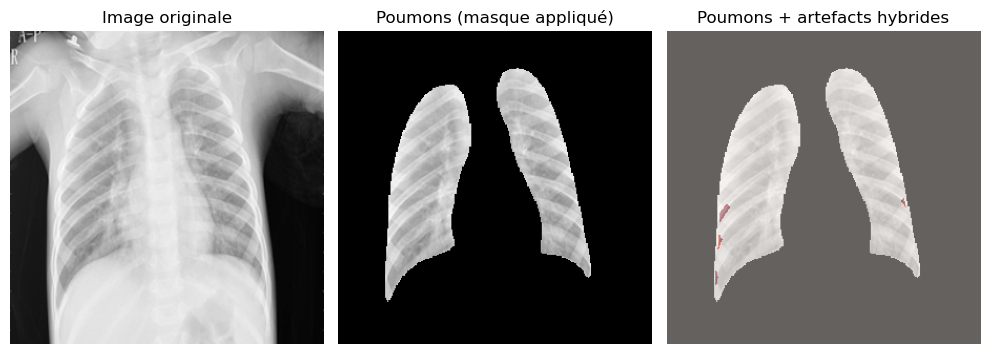


Image: Viral Pneumonia-955.png | classe=Viral Pneumonia | global=True | fft_conf=0.300 | area_ratio=0.0055


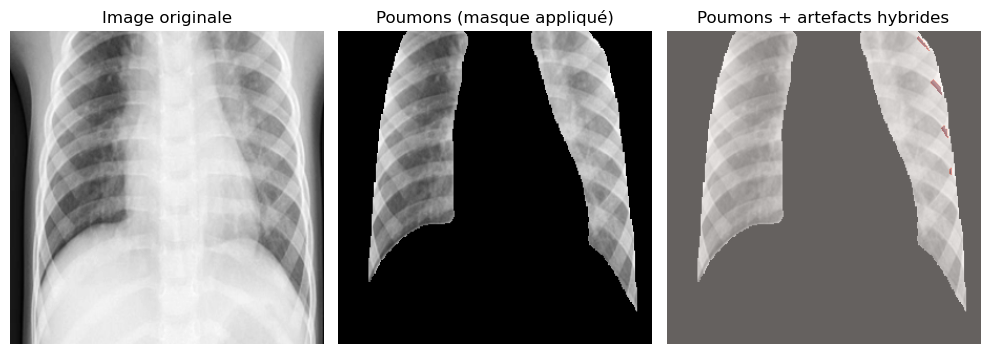


Image: Normal-4757.png | classe=Normal | global=True | fft_conf=0.050 | area_ratio=0.0086


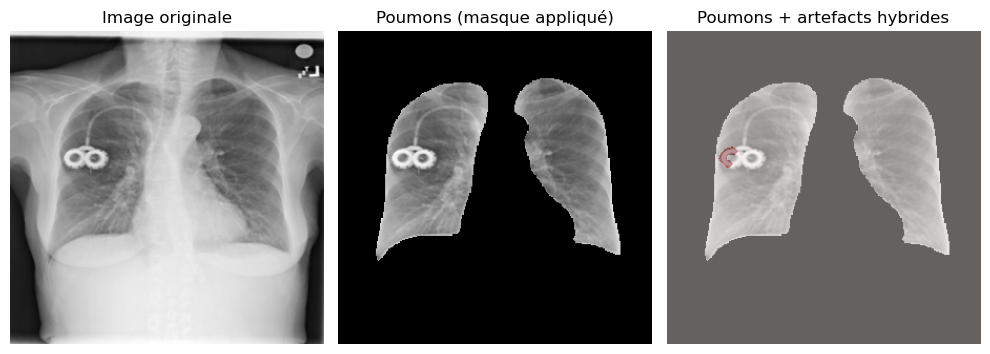


Image: COVID-3112.png | classe=COVID | global=True | fft_conf=0.050 | area_ratio=0.0129


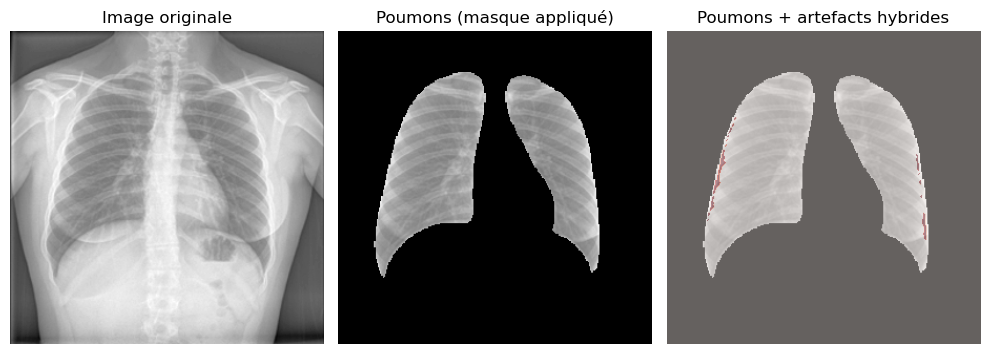


Image: Viral Pneumonia-470.png | classe=Viral Pneumonia | global=True | fft_conf=0.050 | area_ratio=0.0148


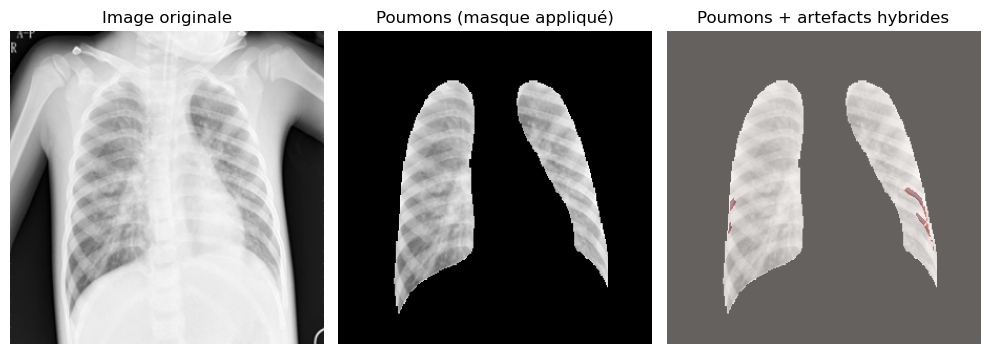


Image: Normal-5577.png | classe=Normal | global=True | fft_conf=0.250 | area_ratio=0.0068


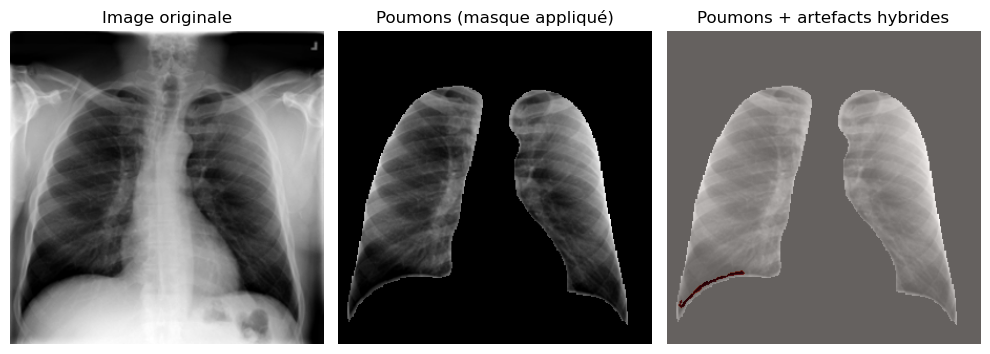


Image: Normal-6778.png | classe=Normal | global=True | fft_conf=0.300 | area_ratio=0.0243


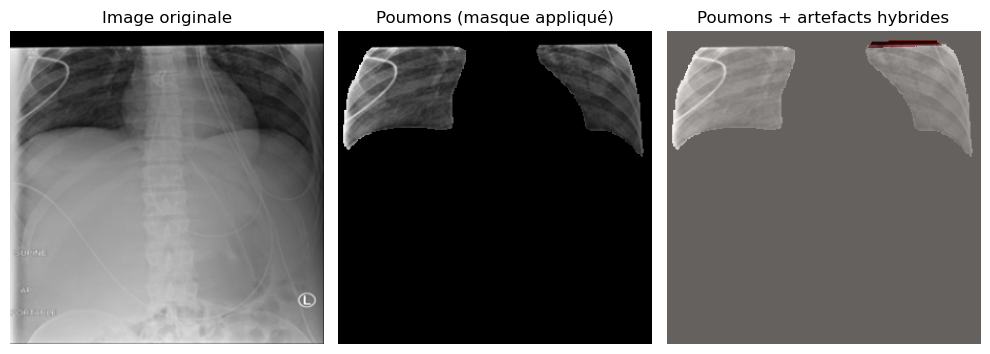


Image: COVID-649.png | classe=COVID | global=True | fft_conf=0.050 | area_ratio=0.0056


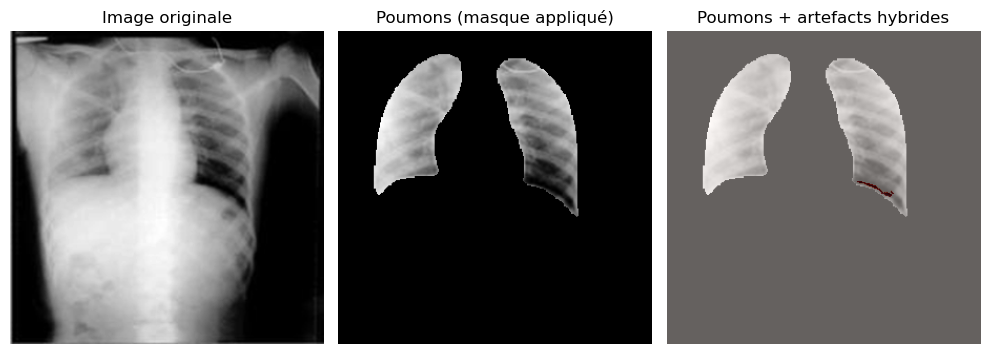


Image: Lung_Opacity-236.png | classe=Lung_Opacity | global=True | fft_conf=0.050 | area_ratio=0.0113


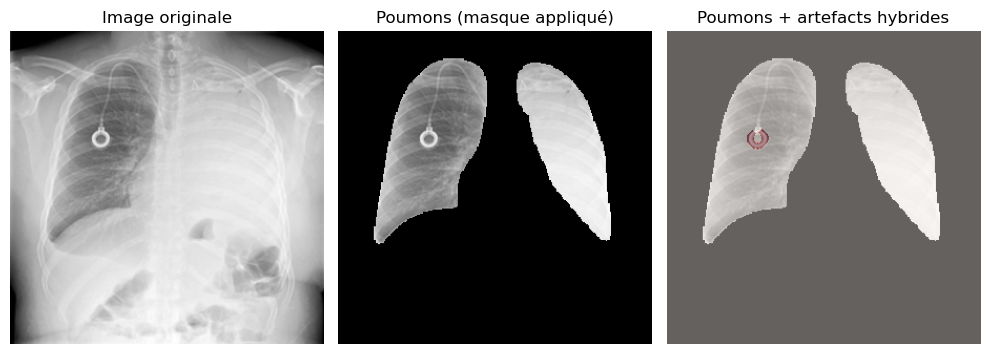


Image: Normal-7787.png | classe=Normal | global=True | fft_conf=0.050 | area_ratio=0.0098


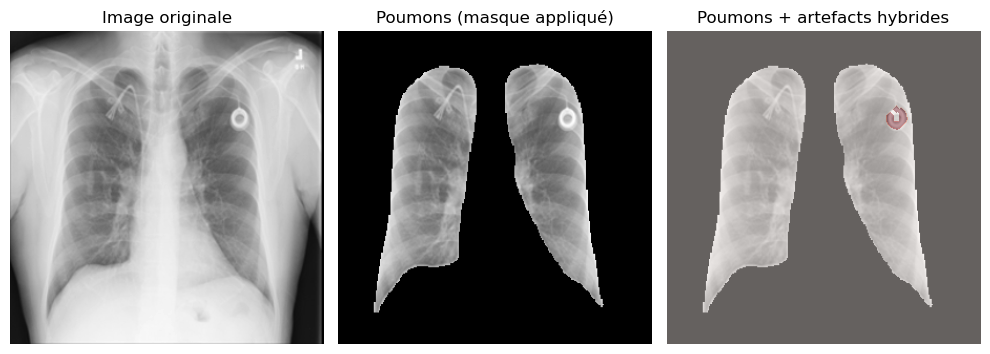


Image: Lung_Opacity-4361.png | classe=Lung_Opacity | global=True | fft_conf=0.050 | area_ratio=0.0053


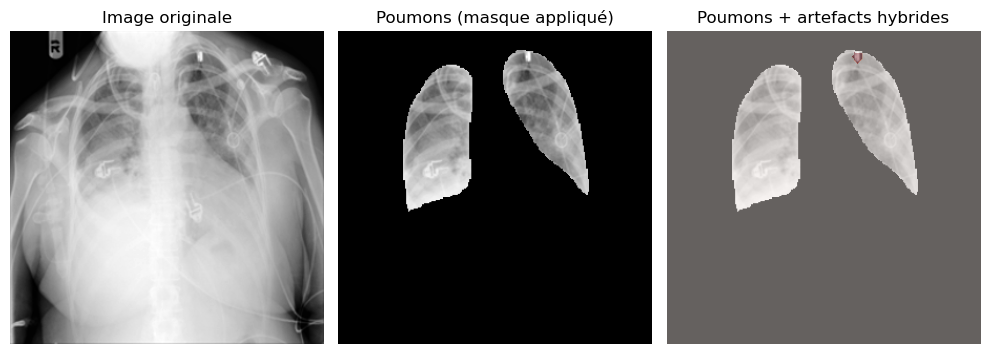


Image: Viral Pneumonia-300.png | classe=Viral Pneumonia | global=True | fft_conf=0.350 | area_ratio=0.0089


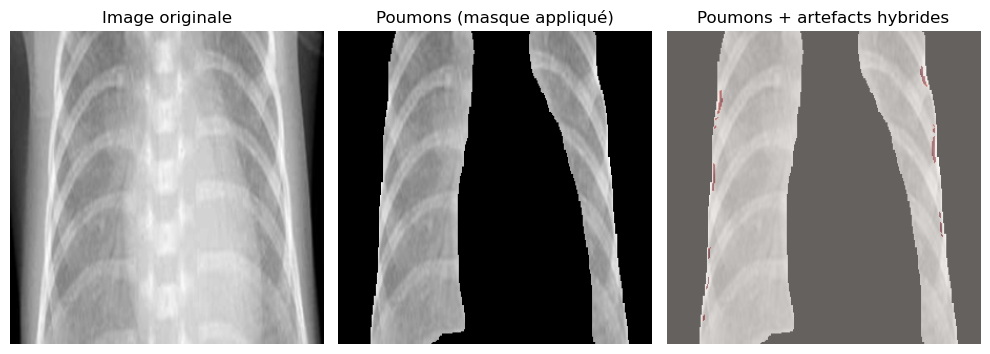


Image: Lung_Opacity-2467.png | classe=Lung_Opacity | global=True | fft_conf=0.050 | area_ratio=0.0083


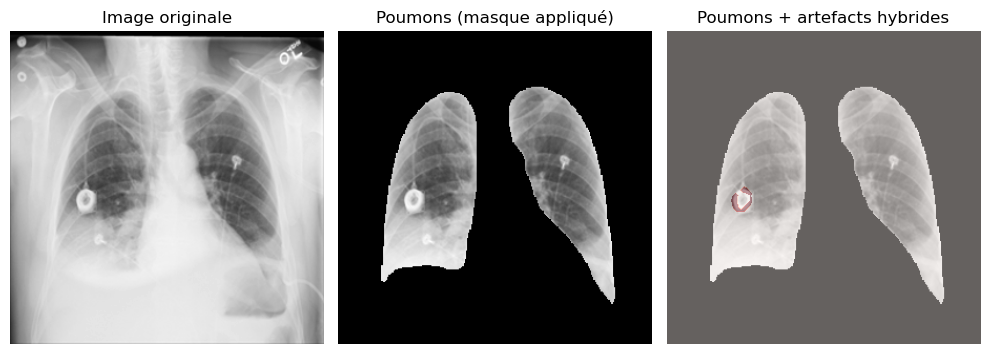


Image: Normal-3623.png | classe=Normal | global=True | fft_conf=0.050 | area_ratio=0.0172


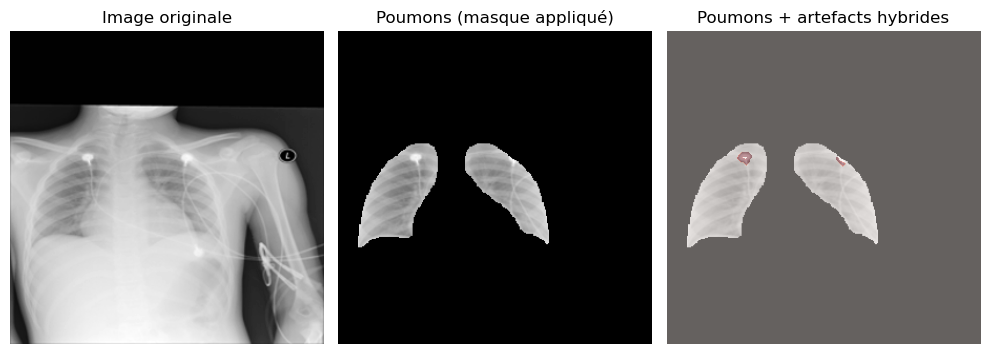


Image: Normal-10096.png | classe=Normal | global=True | fft_conf=0.050 | area_ratio=0.0089


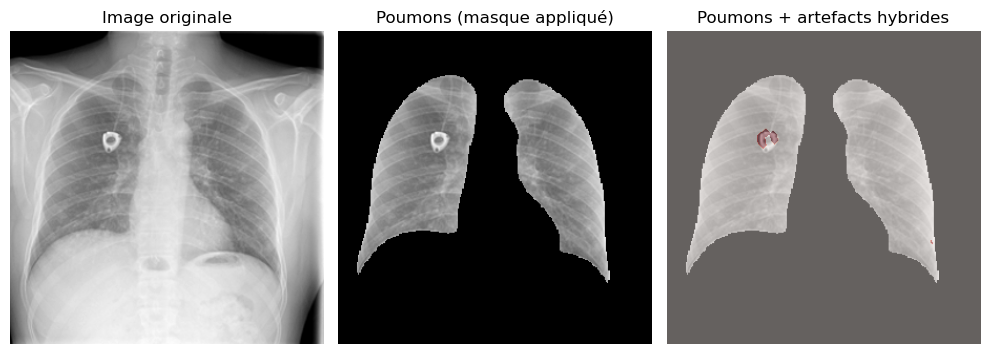


Image: COVID-1837.png | classe=COVID | global=True | fft_conf=0.050 | area_ratio=0.0362


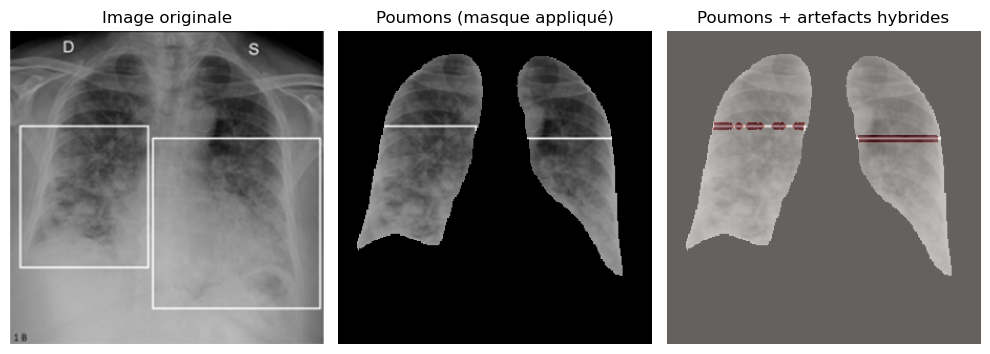


Image: Viral Pneumonia-151.png | classe=Viral Pneumonia | global=True | fft_conf=0.300 | area_ratio=0.0092


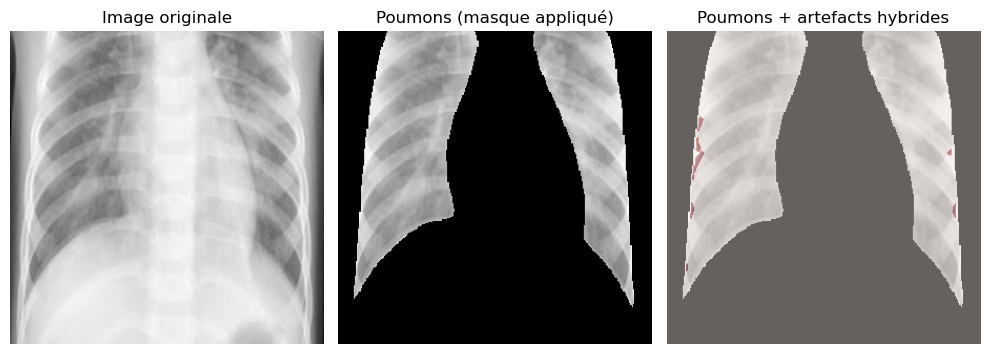


Image: Normal-9410.png | classe=Normal | global=True | fft_conf=0.350 | area_ratio=0.0156


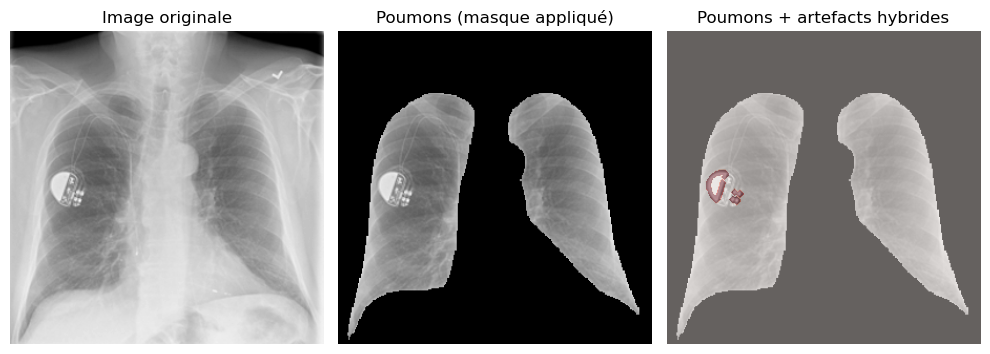


Image: Normal-4776.png | classe=Normal | global=True | fft_conf=0.050 | area_ratio=0.0170


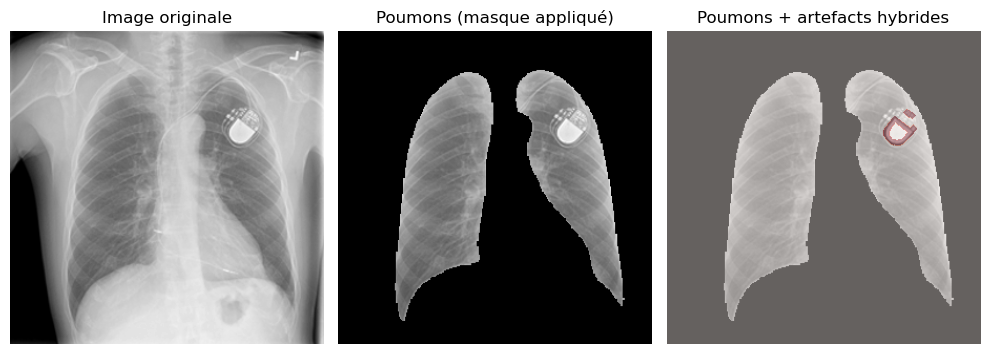


Image: Normal-936.png | classe=Normal | global=True | fft_conf=0.050 | area_ratio=0.0075


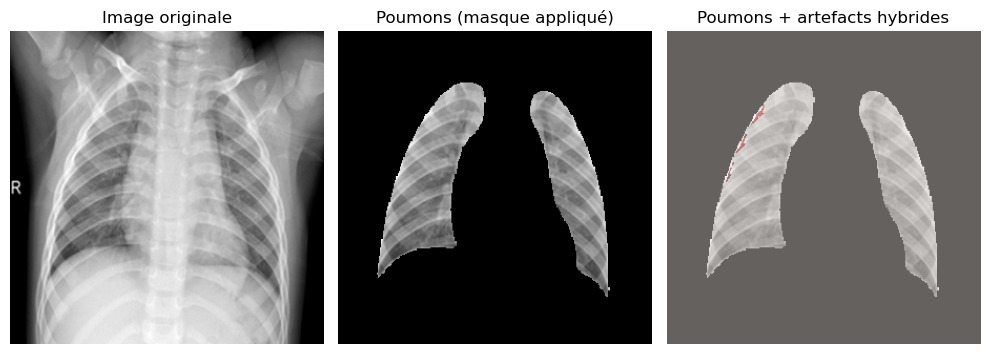


Image: Lung_Opacity-2075.png | classe=Lung_Opacity | global=True | fft_conf=0.050 | area_ratio=0.0061


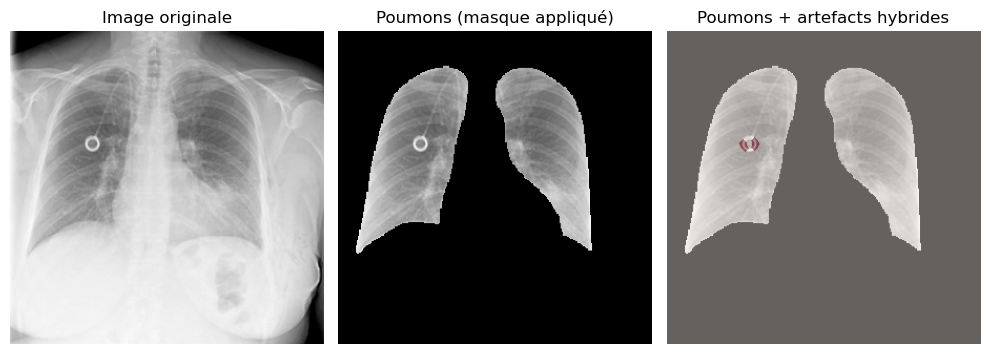


Image: COVID-447.png | classe=COVID | global=True | fft_conf=0.250 | area_ratio=0.0062


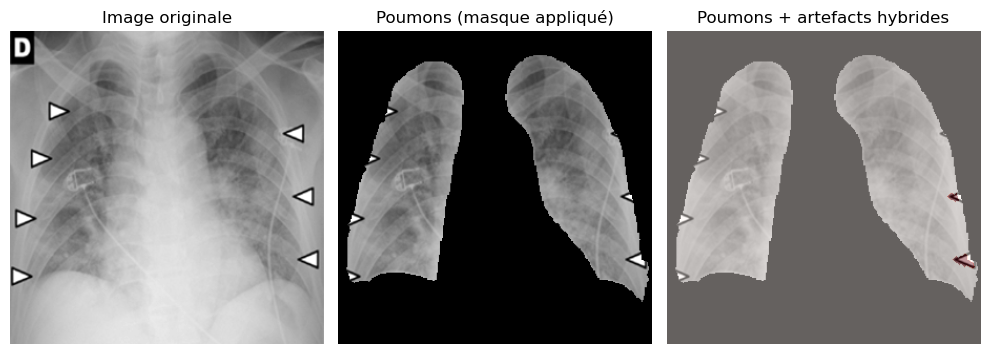


Image: Normal-7845.png | classe=Normal | global=True | fft_conf=0.050 | area_ratio=0.0121


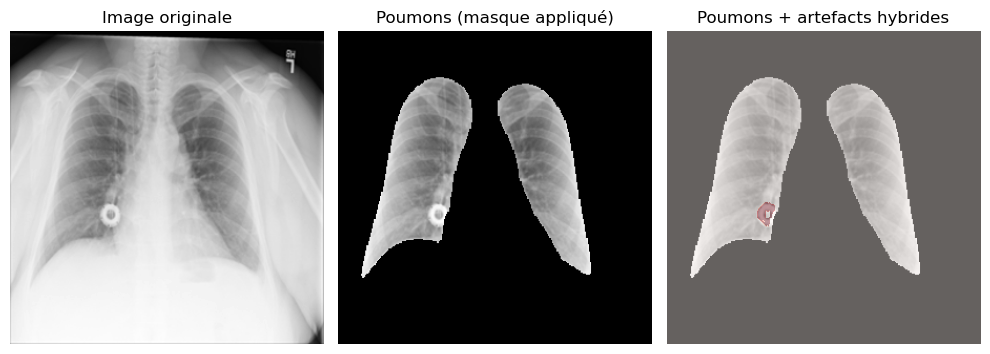


Image: COVID-1541.png | classe=COVID | global=True | fft_conf=0.100 | area_ratio=0.0097


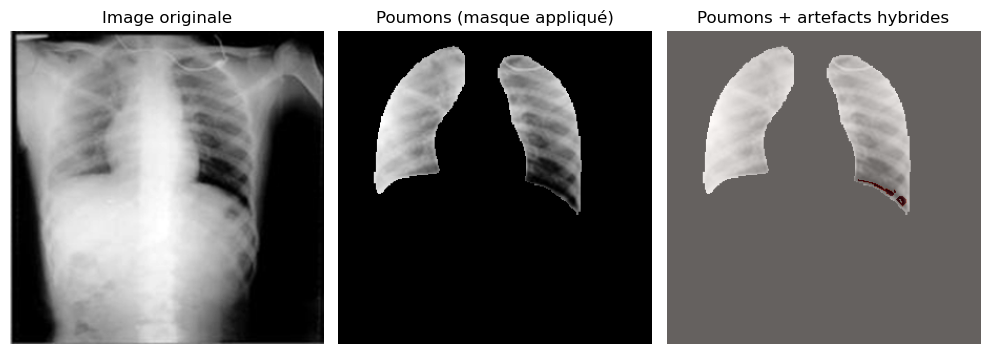


Image: Viral Pneumonia-598.png | classe=Viral Pneumonia | global=True | fft_conf=0.300 | area_ratio=0.0082


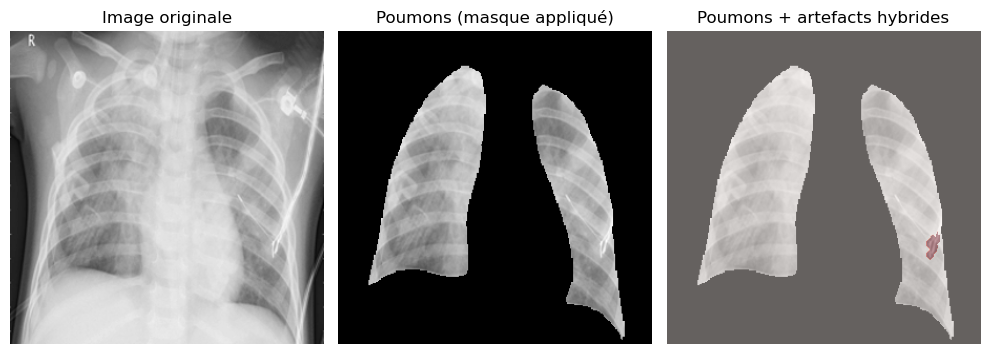


Image: Normal-4330.png | classe=Normal | global=True | fft_conf=0.050 | area_ratio=0.0096


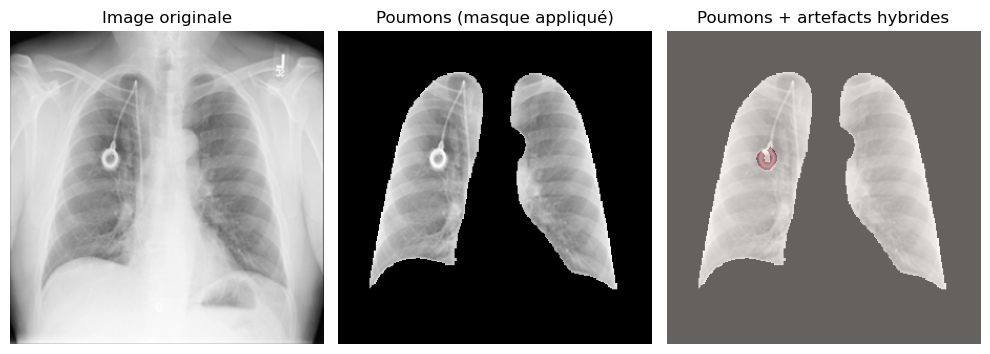


Image: Normal-2968.png | classe=Normal | global=True | fft_conf=0.050 | area_ratio=0.0142


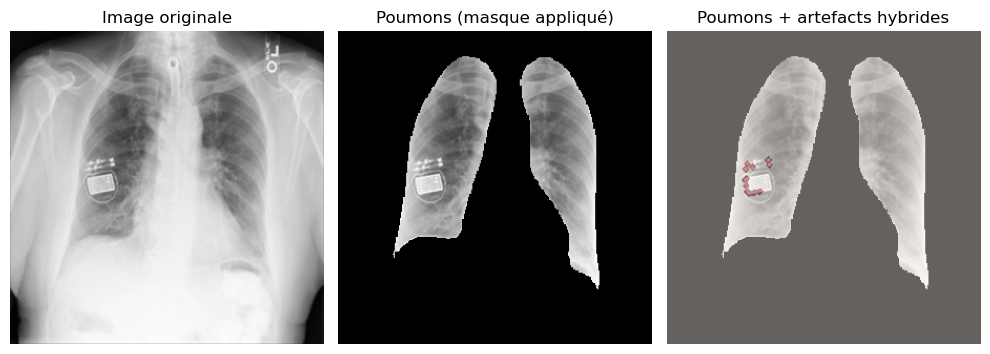


Image: Lung_Opacity-4743.png | classe=Lung_Opacity | global=True | fft_conf=0.050 | area_ratio=0.0057


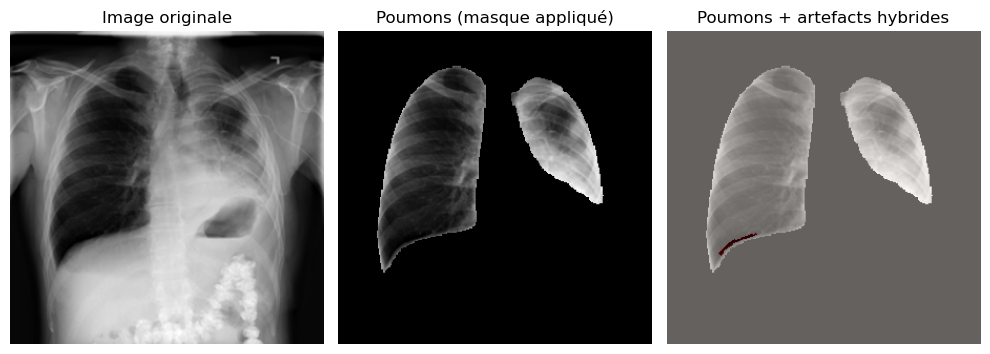


Image: Lung_Opacity-3680.png | classe=Lung_Opacity | global=True | fft_conf=0.050 | area_ratio=0.0067


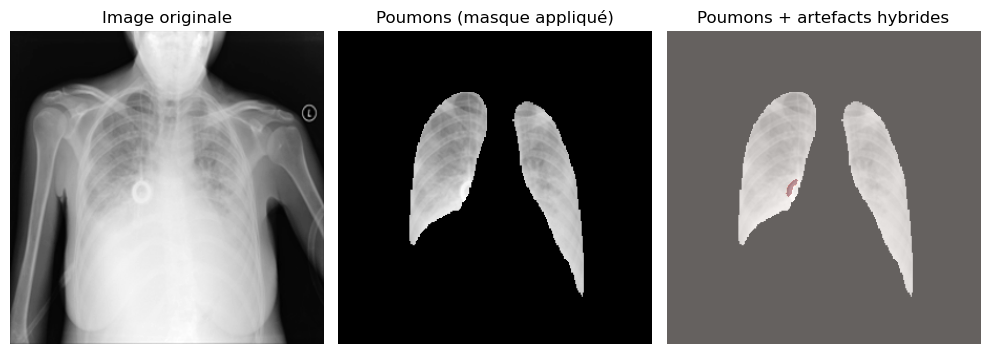

In [ ]:

from features.artifacts_detection_hybrid import detect_artifacts_hybrid

dataset_root = Path("/Users/marouane/projet_covid/COVID-19_Radiography_Dataset")

# On prend quelques images détectées avec artefacts (décision globale hybride)
df_art = df[df["has_artifacts_global"] == True].sample(106, random_state=0)

for _, row in df_art.iterrows():
    img_path = Path(row["image_path"])
    cls = row["class"]

    # Appel de la détection hybride (FFT + contraste/contours, sur poumons uniquement)
    res = detect_artifacts_hybrid(
        img_path=img_path,
        dataset_root=dataset_root,
        threshold_fft=0.3,
        sensitivity="medium",
        use_mask=True,            # analyse limitée aux poumons
        area_ratio_threshold=0.005
    )

    spatial = res["spatial"]
    artifact_mask = spatial["artifact_mask"]          # masque binaire des artefacts
    area_ratio = spatial["area_ratio"]

    # Charger l'image et le masque poumon pour l'affichage
    img = cv2.imread(str(img_path), cv2.IMREAD_GRAYSCALE)
    mask_path = dataset_root / cls / "masks" / img_path.name
    mask = cv2.imread(str(mask_path), cv2.IMREAD_GRAYSCALE)

    if img is None or mask is None:
        print(f"Skip {img_path.name} (image ou masque manquant)")
        continue

    if mask.shape != img.shape:
        mask = cv2.resize(mask, (img.shape[1], img.shape[0]), interpolation=cv2.INTER_NEAREST)

    lungs_only = img.copy()
    lungs_only[mask == 0] = 0   # image masquée (poumons uniquement)

    print(
        f"\nImage: {img_path.name} | classe={cls} | "
        f"global={res['has_artifacts']} | "
        f"fft_conf={res['fft']['confidence']:.3f} | area_ratio={area_ratio:.4f}"
    )

    plt.figure(figsize=(10, 4))
    plt.subplot(1, 3, 1)
    plt.title("Image originale")
    plt.imshow(img, cmap="gray")
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.title("Poumons (masque appliqué)")
    plt.imshow(lungs_only, cmap="gray")
    plt.axis("off")

    plt.subplot(1, 3, 3)
    plt.title("Poumons + artefacts hybrides")
    plt.imshow(lungs_only, cmap="gray")
    plt.imshow(artifact_mask, cmap="Reds", alpha=0.4)
    plt.axis("off")

    plt.tight_layout()
    plt.show()